In [1]:
from typing import Dict,Callable

from tempfile import gettempdir
import matplotlib.pyplot as plt
import numpy as np

import torch
from torch import optim,Tensor,unsqueeze
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset
import torch.autograd
import torch.nn as nn
from torchvision.models.resnet import resnet50,resnet18
import torchvision.transforms as transforms
from torchvision import datasets
from torchvision.utils import save_image
import torch.nn.functional as F

from mydataset import MyTrainDataset, my_dataset_worker_init_func

from tqdm import tqdm

from l5kit.configs import load_config_data
from l5kit.data import LocalDataManager, ChunkedDataset
from l5kit.dataset import AgentDataset, EgoDataset
from l5kit.rasterization import build_rasterizer
from l5kit.evaluation import write_pred_csv, compute_metrics_csv, write_gt_csv, read_gt_csv
from l5kit.evaluation.chop_dataset import MIN_FUTURE_STEPS
from l5kit.evaluation.metrics import neg_multi_log_likelihood, time_displace, average_displacement_error_mean, final_displacement_error_mean
from l5kit.geometry import transform_points
from l5kit.visualization import PREDICTED_POINTS_COLOR, TARGET_POINTS_COLOR, draw_trajectory
from prettytable import PrettyTable
from pathlib import Path

import os
os.environ["KMP_DUPLICATE_LIB_OK"]="True"

D:\anaconda3\envs\stgm\lib\site-packages\l5kit\dataset\select_agents.py:32: UserWarning: Windows detected. BLOSC_NOLOCK has not been set as it causes memory leaks on Windows.However, writing the mask with this config may be inconsistent.
  "Windows detected. BLOSC_NOLOCK has not been set as it causes memory leaks on Windows."


# 数据处理

In [2]:
# set env variable for data
os.environ["L5KIT_DATA_FOLDER"] = "E:/Downloads/lyft-motion-prediction-autonomous-vehicles"
dm = LocalDataManager(None)
# get config
cfg = load_config_data("./agent_motion_config.yaml")
print(cfg)

{'format_version': 4, 'mode': {'load_mode': True}, 'model_params': {'model_architecture': 'CVAE', 'latent_dim': 256, 'num_layers': 2, 'bidirectional': True, 'history_step_size': 1, 'history_num_frames': 49, 'future_step_size': 1, 'future_num_frames': 50, 'step_time': 0.1, 'render_ego_history': True}, 'raster_params': {'raster_mode': 1, 'raster_size': [112, 112], 'pixel_size': [0.75, 0.75], 'ego_center': [0.25, 0.5], 'map_type': 'py_semantic', 'satellite_map_key': 'aerial_map/aerial_map.png', 'semantic_map_key': 'semantic_map/semantic_map.pb', 'dataset_meta_key': 'meta.json', 'filter_agents_threshold': 0.5, 'disable_traffic_light_faces': False, 'set_origin_to_bottom': True}, 'train_data_loader': {'key': 'scenes/sample.zarr', 'batch_size': 32, 'shuffle': True, 'num_workers': 6}, 'val_data_loader': {'key': 'scenes/sample.zarr', 'batch_size': 32, 'shuffle': False, 'num_workers': 5}, 'train_params': {'device': 1, 'epochs': 1}}


In [3]:
if not cfg['mode']['load_mode']:    
    # ===== INIT DATASET
    train_cfg = cfg["train_data_loader"]
    rasterizer = build_rasterizer(cfg, dm)
    train_zarr = ChunkedDataset(dm.require(train_cfg["key"])).open()
    train_dataset = AgentDataset(cfg, train_zarr, rasterizer)
    print(len(train_dataset))
    print(train_dataset)
    print(train_dataset[0].keys())

    train_dataset = MyTrainDataset(cfg, dm, len(train_dataset),raster_mode = cfg["raster_params"]["raster_mode"])
    train_dataloader = DataLoader(
        train_dataset,
        shuffle=train_cfg["shuffle"], 
        batch_size=train_cfg["batch_size"],
        num_workers=train_cfg["num_workers"],
        prefetch_factor = 2,
        pin_memory = True,
        persistent_workers=True,
        worker_init_fn=my_dataset_worker_init_func
    )

# 参数

In [4]:
# 基本参数
if cfg["train_params"]["device"] == 1:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
torch.backends.cudnn.benchmark = True

epochs = cfg["train_params"]["epochs"]
latent_dim = cfg["model_params"]["latent_dim"]  # LSTM 的单元个数
encoder_fc = 64
num_layers = cfg["model_params"]["num_layers"]
bidirectional = cfg["model_params"]["bidirectional"]

encoder_length = cfg["model_params"]["history_num_frames"]
decoder_length = cfg["model_params"]["future_num_frames"]
num_encoder_tokens = 2
num_decoder_tokens = 2
z_dimension = 32
accumulation_steps = 5 # 梯度累积步数

num_classes = 3 # 类数
modal_fc = latent_dim*(1+bidirectional) 
thre = 0.175 # yaw_threshold=10°

In [5]:
def neg_multi_log_likelihood_batch(
    gt: Tensor, pred: Tensor, confidences: Tensor, avails: Tensor
) -> Tensor:
    assert len(pred.shape) == 4, f"expected 3D (MxTxC) array for pred, got {pred.shape}"
    batch_size, num_modes, future_len, num_coords = pred.shape

    assert gt.shape == (batch_size, future_len, num_coords), f"expected 2D (Time x Coords) array for gt, got {gt.shape}"
    assert confidences.shape == (batch_size, num_modes), f"expected 1D (Modes) array for gt, got {confidences.shape}"
    assert torch.allclose(torch.sum(confidences, dim=1), confidences.new_ones((batch_size,))), "confidences should sum to 1"
    assert avails.shape == (batch_size, future_len), f"expected 1D (Time) array for gt, got {avails.shape}"
    # assert all data are valid
    assert torch.isfinite(pred).all(), "invalid value found in pred"
    assert torch.isfinite(gt).all(), "invalid value found in gt"
    assert torch.isfinite(confidences).all(), "invalid value found in confidences"
    assert torch.isfinite(avails).all(), "invalid value found in avails"

    # convert to (batch_size, num_modes, future_len, num_coords)
    gt = torch.unsqueeze(gt, 1)  # add modes
    avails = avails[:, None, :, None]  # add modes and cords

    # error (batch_size, num_modes, future_len)
    error = torch.sum(((gt - pred) * avails) ** 2, dim=-1)  # reduce coords and use availability

    with np.errstate(divide="ignore"):  # when confidence is 0 log goes to -inf, but we're fine with it
        # error (batch_size, num_modes)
        error = torch.log(confidences) - 0.5 * torch.sum(error, dim=-1)  # reduce time

    # use max aggregator on modes for numerical stability
    # error (batch_size, num_modes)
    max_value, _ = error.max(dim=1, keepdim=True)  # error are negative at this point, so max() gives the minimum one
    error = -torch.log(torch.sum(torch.exp(error - max_value), dim=-1, keepdim=True)) - max_value  # reduce modes
    # print("error", error)
    return torch.mean(error)

# 模型

In [6]:
class CVAE(nn.Module):
    def __init__(self):
        super(CVAE, self).__init__()

        # 定义序列编码器
        self.encoder = nn.LSTM(
            num_encoder_tokens, latent_dim, num_layers=num_layers, bidirectional=bidirectional, batch_first=True)
        self.encoder2 = nn.Linear(latent_dim*(1+bidirectional), encoder_fc)
#         self.encoder2 = nn.Linear(latent_dim*(1+bidirectional)+modal_fc, encoder_fc)
#         self.encoder_mean1 = nn.Linear(latent_dim*(1+bidirectional), 64)
        self.encoder_mean2 = nn.Linear(encoder_fc, z_dimension)
#         self.encoder_std1 = nn.Linear(latent_dim*(1+bidirectional), 32)
        self.encoder_std2 = nn.Linear(encoder_fc, z_dimension)

        # 定义序列解码器
        self.decoder = nn.LSTM(z_dimension*2, latent_dim, num_layers=num_layers,
                               bidirectional=bidirectional, batch_first=True)
        self.decoder_fc = nn.Linear(latent_dim*(1+bidirectional), 64)
        self.decoder_fc1 = nn.Linear(64, num_decoder_tokens)
        self.decoder_fc2 = nn.Linear(64, num_decoder_tokens)
        self.decoder_fc3 = nn.Linear(64, num_decoder_tokens)
        self.decoder_confi = nn.Linear(6, num_classes)

        # 定义图像编码器
        # load pre-trained Conv2D model
        self.resnet = resnet50(pretrained=True)
        # change input channels number to match the rasterizer's output
        num_history_channels = (
            cfg["model_params"]["history_num_frames"] + 1) * 2
        num_in_channels = 3 + num_history_channels
        self.resnet.conv1 = nn.Conv2d(
            num_in_channels,
            self.resnet.conv1.out_channels,
            kernel_size=self.resnet.conv1.kernel_size,
            stride=self.resnet.conv1.stride,
            padding=self.resnet.conv1.padding,
            bias=False,
        )
        # change output size to (X, Y) * number of future states
        num_targets = z_dimension * cfg["model_params"]["future_num_frames"]
        self.resnet.fc = nn.Linear(in_features=2048, out_features=num_targets)
        self.encoder_mean3 = nn.Linear(encoder_fc, z_dimension)
        self.encoder_std3 = nn.Linear(encoder_fc, z_dimension)

    def noise_reparameterize(self, mean, logvar):
        eps = torch.randn(mean.shape).to(device)
        z = mean + eps * torch.exp(logvar)
        return z

    def forward(self, data):
        inputs1 = torch.FloatTensor(data["history_positions"]).to(device)
#         yaw = torch.FloatTensor(data["history_yaws"]).to(device)
        if inputs1.dim() == 2:
            inputs1 = torch.unsqueeze(inputs1, 0)

        h0 = torch.autograd.Variable(torch.randn(
            num_layers*(1+bidirectional), inputs1.size()[0], latent_dim)).to(device)
        c0 = torch.autograd.Variable(torch.randn(
            num_layers*(1+bidirectional), inputs1.size()[0], latent_dim)).to(device)

        inputs2 = torch.FloatTensor(data["image"]).to(device)
        if inputs2.dim() == 3:
            inputs2 = torch.unsqueeze(inputs2, 0)

        out1, _ = self.encoder(inputs1, (h0, c0))
#         out1 = out1[:,-1,:]
#         out1 = torch.unsqueeze(out1, 1)
#         out1 = out1.expand(out1.size()[0],decoder_length,out1.size()[-1])
        out1 = F.relu(self.encoder2(out1), inplace=True)

#         mean1 = F.relu(self.encoder_mean1(out1), inplace=True)
        mean2 = F.relu(self.encoder_mean2(out1), inplace=True)
#         logstd1 = F.relu(self.encoder_std1(out1), inplace=True)
        logstd2 = F.relu(self.encoder_std2(out1), inplace=True)
        # prevent from poster vanish
#         logstd2 = torch.abs(logstd2) + 0.6

        z1 = self.noise_reparameterize(mean2, logstd2)
        z1 = z1[:, -1, :]
        z1 = torch.unsqueeze(z1, 1)
        z1 = z1.expand(z1.size()[0], decoder_length, z1.size()[-1])

        z2 = self.resnet(inputs2).reshape(z1.size())
        z = torch.cat([z1, z2], -1)
        out2, _ = self.decoder(z)
        out2 = F.relu(self.decoder_fc(out2), inplace=True)

        out21 = F.relu(self.decoder_fc1(out2), inplace=True)
        out22 = F.relu(self.decoder_fc2(out2), inplace=True)
        out23 = F.relu(self.decoder_fc3(out2), inplace=True)
        confs = torch.cat([out21, out22, out23], dim=-1)
        confidences = F.softmax(self.decoder_confi(confs)[:, -1, :], dim=-1)
        
        out21 = torch.unsqueeze(out21, 1)
        out22 = torch.unsqueeze(out22, 1)
        out23 = torch.unsqueeze(out23, 1)
        y_hat = torch.cat([out21, out22, out23], dim=1)

        return y_hat, confidences, mean2, logstd2


def label_maker(yaw):
    yaw = yaw.squeeze()
#     print(yaw.size())
    ind = torch.argmax(torch.abs(yaw), dim=-1)
#     print(ind.size())
    yaw = yaw[torch.arange(len(yaw)), ind]
    yaw = yaw.unsqueeze(dim=-1)
    w = torch.cat([yaw, yaw, yaw], dim=-1)
    one = torch.ones_like(yaw)
    label1 = torch.tensor([0., 0., 1.]).to(device)
    label1 = label1.expand(len(yaw), num_classes)
    label2 = torch.tensor([0., 1., 0.]).to(device)
    label2 = label2.expand(len(yaw), num_classes)
    label3 = torch.tensor([1., 0., 0.]).to(device)
    label3 = label3.expand(len(yaw), num_classes)

    w = torch.where(yaw >= thre, label1, w)
    yaw = torch.where(yaw >= thre, one, yaw)

    w = torch.where(yaw <= -thre, label3, w)
    yaw = torch.where(yaw <= -thre, one, yaw)

    w = torch.where(yaw < thre, label2, w)
#     w = torch.LongTensor(w).to(device)
    return w


def loss_function(y_hat, confidences, data, mean, std):
    y_availabilities = data["target_availabilities"].to(device)
    yaw = data["target_yaws"].to(device)
    label = label_maker(yaw)
    y_true = data["target_positions"].to(device)
#     MSE = F.mse_loss(y_hat, y_true, reduction='none')
#     MSE = MSE * y_availabilities
#     MSE = MSE.mean()
    Cross = F.binary_cross_entropy_with_logits(confidences, label)
    NLL = neg_multi_log_likelihood_batch(
        y_true, y_hat, confidences, y_availabilities)
    # 因为var是标准差的自然对数，先求自然对数然后平方转换成方差
    var = torch.pow(torch.exp(std), 2)
    KLD = -0.5 * torch.mean(1+torch.log(var)-torch.pow(mean, 2)-var)
    KLD = torch.max(KLD,torch.ones_like(KLD))
#     print('KLD: ',KLD,' NLL: ',NLL,' Cross: ', Cross)
    return NLL, KLD, Cross


# 创建对象
cvae = CVAE().to(device)
# vae.load_state_dict(torch.load('./VAE_z2.pth'))
cvae_optimizer = torch.optim.Adam(cvae.parameters(), lr=1e-4)

In [7]:
if not cfg['mode']['load_mode']:    
    # ==== TRAIN LOOP
    losses_avg = []
    for epoch in range(epochs):  # 进行多个epoch的训练
        tr_it = iter(train_dataloader)
        progress_bar = tqdm(range(len(train_dataloader)//1),position=0)
        losses_train = []
        cvae_optimizer.zero_grad(set_to_none = True)
        for i in progress_bar:
            try:
                data = next(tr_it)
            except StopIteration:
                tr_it = iter(train_dataloader)
                data = next(tr_it)
            cvae.train() # 设置为训练模式
            torch.set_grad_enabled(True)
            y_hat, confidences, mean, std = cvae(data)  # 输入
            if cfg["train_params"]["device"] == 1:
                with torch.cuda.amp.autocast():
                    NLL,KLD,Cross = loss_function(y_hat, confidences, data, mean, std)
                    loss = NLL + (50)*KLD + 20*Cross
                    if i + 1>= len(train_dataloader)//1:
                        print(NLL,KLD,Cross)
            else:
                NLL,KLD,Cross = loss_function(y_hat, confidences, data, mean, std)
                loss = NLL + (50)*KLD + 20*Cross
                if i + 1>= len(train_dataloader)//1:
                    print(NLL,KLD,Cross)

            # Backward pass
            # 梯度累积模式
            loss = loss / accumulation_steps
            loss.backward() 
            if (i+1) % accumulation_steps == 0:
                cvae_optimizer.step()
                cvae_optimizer.zero_grad(set_to_none = True)

            # 无梯度累积模式
    #         cvae_optimizer.zero_grad(set_to_none = True)
    #         loss.backward()
    #         cvae_optimizer.step()
            losses_train.append(loss.item())
            progress_bar.set_description(f"loss: {loss.item()} loss(avg): {np.mean(losses_train)}")
        losses_avg.append(np.mean(losses_train))

# 结果

In [8]:
if not cfg['mode']['load_mode']:    
    torch.save(cvae.state_dict(),'E:/Downloads/cvae.pth')
    plt.plot(np.arange(len(losses_train)), losses_train, label="train loss")
    plt.legend()
    plt.show()

In [9]:
if not cfg['mode']['load_mode'] and cfg['train_params']['epochs'] > 1: 
    plt.plot(np.arange(len(losses_avg)), losses_avg, label="train loss")
    plt.legend()
    plt.show()

# 评估

In [10]:
eval_cfg = cfg["val_data_loader"]
rasterizer = build_rasterizer(cfg, dm)
eval_zarr = ChunkedDataset(dm.require(eval_cfg["key"])).open()
eval_dataset = AgentDataset(cfg, eval_zarr, rasterizer)
print(len(eval_dataset))
print(eval_dataset[0].keys())
# print(len(eval_dataset))

eval_dataset = MyTrainDataset(cfg, dm, len(eval_dataset),raster_mode = cfg["raster_params"]["raster_mode"])
eval_dataloader = DataLoader(
    eval_dataset,
    shuffle=eval_cfg["shuffle"], 
    batch_size=eval_cfg["batch_size"],
    num_workers=eval_cfg["num_workers"],
    prefetch_factor = 2,
    persistent_workers=True,
    pin_memory = True,
    worker_init_fn=my_dataset_worker_init_func
)
pred_path = "E:/Downloads/pred.csv"
eval_gt_path = "E:/Downloads/gt.csv"
cvae.load_state_dict(torch.load('E:/Downloads/cvae.pth'))
print(len(eval_dataloader))

111634
dict_keys(['frame_index', 'image', 'target_positions', 'target_yaws', 'target_velocities', 'target_availabilities', 'history_positions', 'history_yaws', 'history_velocities', 'history_availabilities', 'world_to_image', 'raster_from_agent', 'raster_from_world', 'agent_from_world', 'world_from_agent', 'centroid', 'yaw', 'extent', 'history_extents', 'future_extents', 'curr_speed', 'scene_index', 'host_id', 'timestamp', 'track_id'])
3489


## 保存预测

In [11]:
# ==== EVAL LOOP
cvae.eval()
torch.set_grad_enabled(False)
losses_test = []

# store information for evaluation
future_coords_offsets_pd = []
gt_coords_offsets_pd = []
timestamps = []
agent_ids = []
availability = []
confs = []
tr_it = iter(eval_dataloader)
progress_bar = tqdm(range(len(eval_dataloader)//1),position=0)

for i in progress_bar:
    try:
        data = next(tr_it)
    except StopIteration:
        tr_it = iter(eval_dataloader)
        data = next(tr_it)
    y_hat, confidences,mean,std = cvae(data)
    if cfg["train_params"]["device"] == 1:
        with torch.cuda.amp.autocast():
            NLL,KLD,Cross = loss_function(y_hat, confidences, data, mean, std)
            loss = NLL + (50)*KLD + 20*Cross
    losses_test.append(loss.item())
    progress_bar.set_description(f"loss: {loss.item()} loss(avg): {np.mean(losses_test)}")
#     print(data)
    # convert agent coordinates into world offsets
    agents_coords = y_hat.detach().cpu().numpy()
    gt_coords = data['target_positions'].numpy()
    world_from_agents = data['world_from_agent'].numpy()
    centroids = data["centroid"].numpy()
    coords_offset1 = transform_points(agents_coords[:,0,:,:], world_from_agents) - centroids[:, None, :2]
    coords_offset2 = transform_points(agents_coords[:,1,:,:], world_from_agents) - centroids[:, None, :2]
    coords_offset3 = transform_points(agents_coords[:,2,:,:], world_from_agents) - centroids[:, None, :2]
    coords_offset = np.stack([coords_offset1,coords_offset2,coords_offset3],1)
    gt_offset = transform_points(gt_coords, world_from_agents) - centroids[:, None, :2]
    
    future_coords_offsets_pd.append(np.stack(coords_offset))
    gt_coords_offsets_pd.append(np.stack(gt_offset))
    timestamps.append(data["timestamp"].numpy().copy())
    agent_ids.append(data["track_id"].numpy().copy())
    availability.append(data["target_availabilities"].numpy().copy())
    confs.append(confidences.detach().cpu().numpy().copy())

write_pred_csv(pred_path,
               timestamps=np.concatenate(timestamps),
               track_ids=np.concatenate(agent_ids),
               coords=np.concatenate(future_coords_offsets_pd),
               confs=np.concatenate(confs)
              )

write_gt_csv(eval_gt_path,timestamps=np.concatenate(timestamps),
               track_ids=np.concatenate(agent_ids),
               coords=np.concatenate(gt_coords_offsets_pd),avails=np.concatenate(availability))

loss: 67.99940490722656 loss(avg): 190.41381090710314: 100%|███████████████████████| 3489/3489 [22:36<00:00,  2.57it/s]


## 预测结果

In [12]:
metrics = compute_metrics_csv(eval_gt_path, pred_path, [
                              neg_multi_log_likelihood, time_displace])
for metric_name, metric_mean in metrics.items():
    print(metric_name, metric_mean)
    if metric_name=="time_displace":
        FDE = metric_mean
print('FDE1s: {}, FDE3s: {}, FDE5s: {}, ADE1s: {}, ADE3s: {}, ADE5s: {} '.format(
    FDE[10//cfg["model_params"]["future_step_size"]-1], FDE[30//cfg["model_params"]["future_step_size"]-1], FDE[50//cfg["model_params"]["future_step_size"]-1], np.mean(FDE[:10//cfg["model_params"]["future_step_size"]]), np.mean(FDE[:30//cfg["model_params"]["future_step_size"]]), np.mean(FDE[:50//cfg["model_params"]["future_step_size"]])))

neg_multi_log_likelihood 123.38760383703527
time_displace [0.15044785 0.16293568 0.19992711 0.24123213 0.27850737 0.30645328
 0.33092392 0.35053522 0.37525939 0.39450492 0.41786272 0.43781547
 0.45923156 0.47724132 0.49491582 0.51502614 0.53224699 0.55066564
 0.56770841 0.58460496 0.60208762 0.61758714 0.63571817 0.65246597
 0.66842499 0.68606238 0.70215629 0.7198135  0.7369809  0.75453242
 0.77318329 0.79246144 0.81271301 0.83237502 0.85183524 0.87125233
 0.89578205 0.92503503 0.9602107  1.00245434 1.0525329  1.11037792
 1.17335983 1.24020009 1.31186313 1.38876665 1.46977581 1.56170179
 1.72397527 2.42514696]
FDE1s: 0.3945049171193471, FDE3s: 0.7545324228134707, FDE5s: 2.4251469555738723, ADE1s: 0.27907268650671, ADE3s: 0.48679584212219307, ADE5s: 0.7555775609461213 


[[0.46369526 0.00519934 0.53110534]]
[[0.4089508  0.17732324 0.4137259 ]]


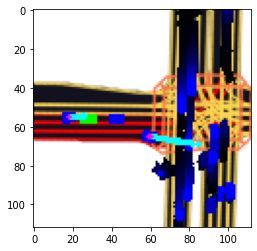

[[0.4132425  0.1687593  0.41799825]]
[[0.46510574 0.00824349 0.52665085]]
[[0.45712164 0.00229245 0.5405859 ]]


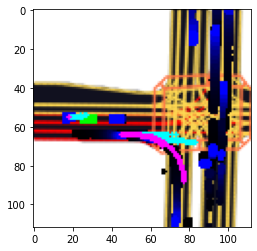

[[0.38499084 0.22821403 0.38679516]]


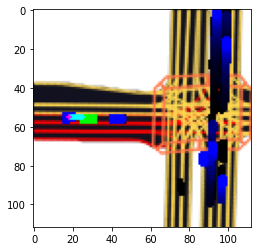

[[0.4018598  0.1919965  0.40614372]]


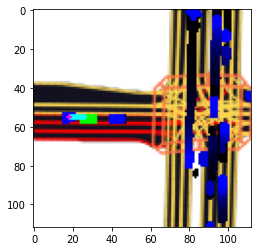

[[0.40466616 0.19231446 0.40301937]]


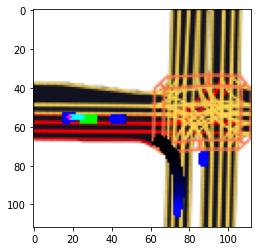

[[0.411856   0.17188251 0.4162615 ]]
[[0.46626717 0.01151227 0.5222206 ]]


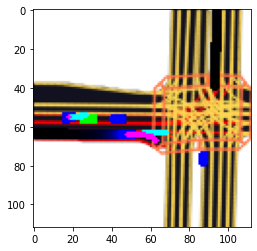

[[0.4125756  0.16986069 0.41756365]]
[[5.2413356e-01 4.9988387e-08 4.7586644e-01]]


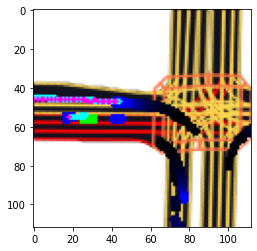

[[0.40250796 0.1930831  0.404409  ]]


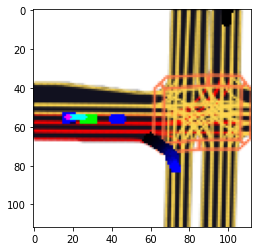

[[0.46216983 0.04318531 0.4946448 ]]
[[0.456797   0.00129277 0.54191023]]
[[0.45845988 0.00357828 0.53796184]]
[[0.47303897 0.0184081  0.5085529 ]]
[[0.45810786 0.06175972 0.48013243]]


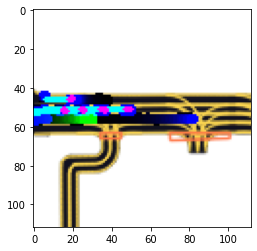

[[0.46778575 0.00328014 0.5289341 ]]
[[4.3719131e-01 2.5434353e-04 5.6255430e-01]]


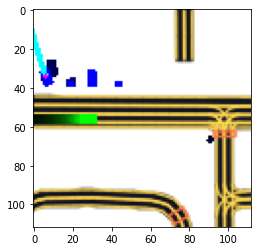

[[5.3385413e-01 1.8611917e-08 4.6614590e-01]]


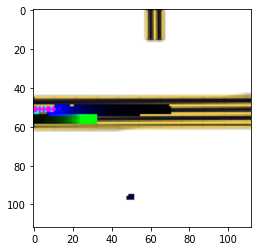

[[4.3477032e-01 4.7294590e-05 5.6518239e-01]]


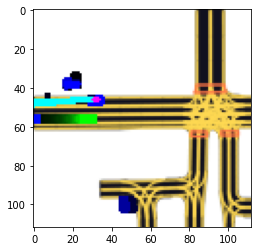

[[0.4710866  0.02266777 0.5062457 ]]


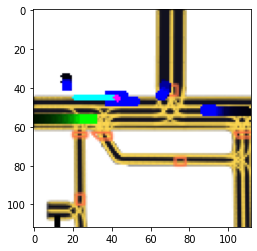

[[0.46402177 0.04593773 0.49004054]]
[[0.46639127 0.02694112 0.5066676 ]]
[[4.3501377e-01 3.7316524e-04 5.6461310e-01]]
[[0.45515758 0.00195551 0.5428869 ]]
[[4.8902556e-01 3.9194325e-07 5.1097405e-01]]


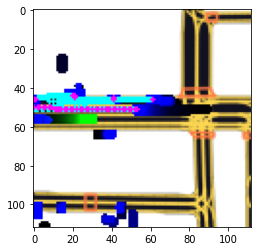

[[0.42372644 0.1431084  0.43316516]]
[[0.47278994 0.00635539 0.52085465]]
[[0.46751267 0.04553368 0.48695362]]
[[0.4652815  0.03481758 0.49990097]]
[[4.438282e-01 1.073582e-05 5.561611e-01]]
[[0.4683835  0.04707149 0.48454502]]


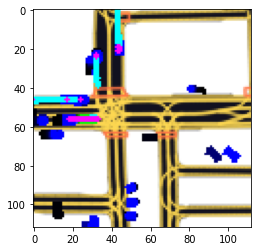

[[0.4455801 0.0009549 0.553465 ]]
[[0.444086   0.09373613 0.46217787]]
[[4.341688e-01 3.873822e-04 5.654439e-01]]
[[0.45091805 0.00104133 0.5480406 ]]


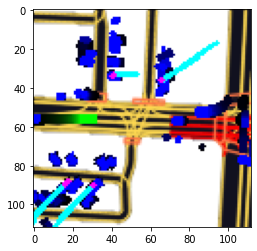

[[0.46245548 0.00265435 0.5348902 ]]
[[4.327157e-01 2.669812e-04 5.670173e-01]]
[[4.4142139e-01 4.3557870e-04 5.5814296e-01]]
[[4.4252217e-01 1.6084565e-05 5.5746174e-01]]


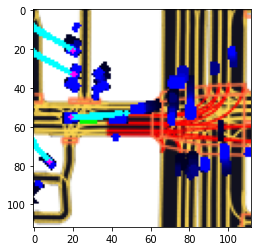

[[0.46491453 0.02809562 0.5069899 ]]
[[0.44858363 0.00130589 0.5501105 ]]
[[4.3855354e-01 4.3533687e-04 5.6101114e-01]]
[[4.3716979e-01 3.1005006e-04 5.6252015e-01]]
[[4.3652993e-01 4.5537108e-04 5.6301469e-01]]


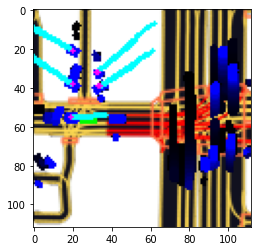

[[0.45759493 0.05931746 0.48308763]]
[[4.3084565e-01 2.0239018e-04 5.6895196e-01]]
[[0.44011322 0.00061189 0.55927485]]
[[4.421098e-01 8.131969e-06 5.578821e-01]]
[[4.4958338e-01 9.0903923e-06 5.5040747e-01]]
[[0.46279562 0.03903726 0.4981671 ]]
[[4.5330068e-01 3.8876074e-06 5.4669541e-01]]


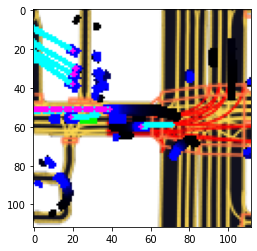

[[0.45788944 0.06186962 0.48024097]]
[[0.46808374 0.01416156 0.51775473]]
[[0.4399909  0.10903145 0.4509776 ]]
[[4.3412942e-01 1.5667810e-04 5.6571394e-01]]
[[0.44172728 0.00058266 0.5576901 ]]
[[0.47175193 0.01188003 0.51636803]]
[[4.4381586e-01 5.2474480e-04 5.5565935e-01]]
[[4.3858841e-01 9.7434458e-06 5.6140184e-01]]
[[0.43528354 0.00057346 0.564143  ]]


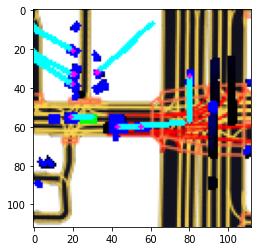

[[4.283041e-01 9.904915e-05 5.715968e-01]]
[[4.3076485e-01 1.4837339e-04 5.6908673e-01]]
[[4.4436812e-01 5.1799056e-04 5.5511391e-01]]
[[4.3720430e-01 1.4811857e-05 5.6278086e-01]]
[[0.45213047 0.00219702 0.5456725 ]]
[[0.4576714  0.00183539 0.5404932 ]]


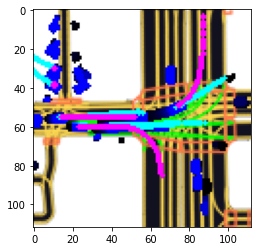

[[0.4682621  0.01421471 0.51752317]]
[[0.44224665 0.00080196 0.5569514 ]]
[[0.45022595 0.00075277 0.54902124]]
[[0.4426229  0.09751849 0.4598586 ]]
[[0.4683519  0.01498512 0.51666296]]
[[0.45665368 0.00274068 0.54060566]]
[[4.4381121e-01 3.8156612e-04 5.5580723e-01]]
[[0.45418054 0.0030319  0.54278755]]


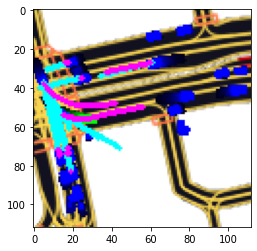

[[0.46207145 0.05050625 0.48742235]]
[[0.45727223 0.0655758  0.477152  ]]
[[0.46757838 0.01831625 0.5141054 ]]
[[4.4940850e-01 6.0823386e-06 5.5058545e-01]]
[[0.4611713  0.00260937 0.5362193 ]]
[[0.44376808 0.09698235 0.45924953]]
[[0.4693402  0.02206228 0.5085975 ]]
[[0.4672439  0.00544338 0.5273127 ]]
[[0.4612993  0.05089349 0.4878072 ]]
[[0.46928963 0.02619121 0.50451916]]


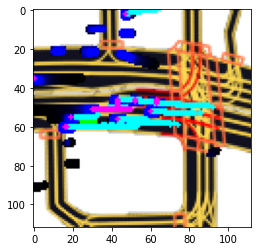

[[0.42985982 0.12882848 0.44131166]]
[[0.47816747 0.01209946 0.5097331 ]]
[[4.9234915e-01 3.6667979e-07 5.0765049e-01]]
[[0.46559373 0.03951808 0.49488825]]
[[0.46934298 0.01091031 0.5197467 ]]
[[0.46116537 0.00237999 0.5364547 ]]
[[0.39192843 0.21582918 0.39224234]]
[[0.46450374 0.00397484 0.5315214 ]]
[[0.460764   0.05095065 0.48828536]]
[[4.2605379e-01 2.0429604e-04 5.7374191e-01]]
[[0.4523634  0.07866974 0.4689668 ]]


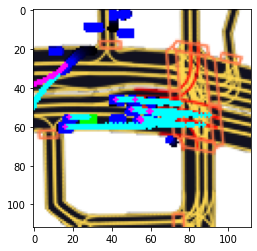

[[0.4680381  0.01953732 0.5124246 ]]
[[0.45994797 0.00536755 0.5346845 ]]
[[0.40508538 0.185229   0.40968567]]
[[0.46416122 0.00607982 0.529759  ]]
[[5.3495938e-01 1.7030665e-08 4.6504062e-01]]
[[0.4669775  0.01669859 0.51632386]]
[[0.46211603 0.003275   0.534609  ]]
[[0.45822164 0.00268695 0.5390914 ]]
[[0.46189037 0.0607427  0.4773669 ]]
[[0.46213534 0.00526836 0.5325963 ]]
[[0.4125709  0.16711064 0.42031854]]
[[4.4138661e-01 1.2738462e-05 5.5860072e-01]]


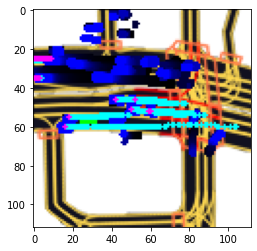

[[4.7048101e-01 1.4104963e-06 5.2951765e-01]]
[[0.45779538 0.00238083 0.5398238 ]]
[[0.41472447 0.16790499 0.41737056]]
[[4.8126712e-01 7.1928486e-07 5.1873213e-01]]
[[5.3682363e-01 2.7175293e-08 4.6317634e-01]]
[[4.6555632e-01 1.7537516e-06 5.3444189e-01]]
[[4.3648580e-01 2.2991169e-04 5.6328428e-01]]
[[0.4644136  0.04262808 0.49295834]]
[[0.4592096 0.0024553 0.5383351]]
[[0.40570793 0.18193693 0.41235512]]
[[0.43277973 0.12243704 0.4447832 ]]
[[0.40702528 0.17664291 0.4163318 ]]
[[0.46433046 0.05088172 0.4847878 ]]
[[0.4601708  0.00651806 0.5333111 ]]
[[0.466443   0.02778926 0.50576764]]


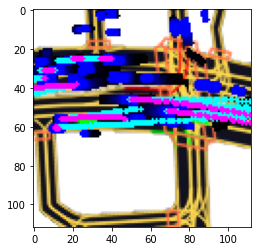

[[0.44294772 0.102832   0.4542202 ]]
[[0.46897542 0.01198004 0.5190446 ]]
[[4.3091527e-01 1.7407002e-04 5.6891060e-01]]
[[0.46598017 0.01042626 0.5235936 ]]
[[4.4351211e-01 5.5481016e-04 5.5593306e-01]]


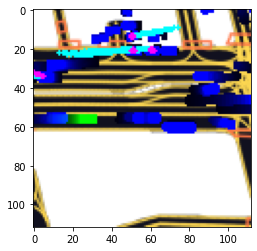

[[5.3433108e-01 1.7355038e-08 4.6566892e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[4.4120562e-01 3.8022199e-04 5.5841416e-01]]
[[4.3530467e-01 2.4434454e-05 5.6467092e-01]]
[[5.3381628e-01 1.6905178e-08 4.6618375e-01]]
[[4.7392529e-01 9.3682388e-07 5.2607375e-01]]


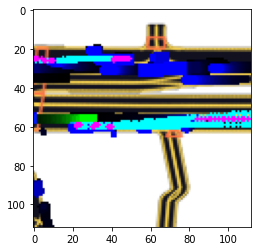

[[0.46243247 0.00601862 0.5315489 ]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.0078893e-01 2.4945308e-07 4.9921083e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


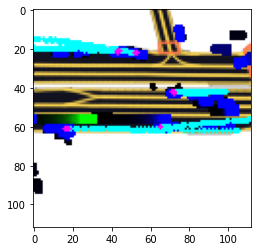

[[0.46068376 0.00097979 0.53833646]]
[[5.2381164e-01 7.7011286e-08 4.7618827e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[4.3515578e-01 3.2197163e-04 5.6452227e-01]]
[[0.4661496  0.00844979 0.52540064]]
[[0.44744197 0.00133934 0.55121875]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[4.3821421e-01 2.4698526e-04 5.6153876e-01]]
[[0.44356057 0.0005647  0.55587465]]
[[0.4522205  0.07459393 0.4731856 ]]
[[0.45111072 0.00110428 0.547785  ]]


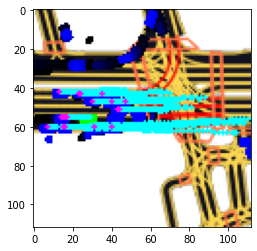

[[0.46418986 0.00388549 0.53192466]]
[[5.3369915e-01 1.6860930e-08 4.6630085e-01]]
[[0.46781003 0.02519931 0.5069907 ]]
[[0.45809147 0.00384253 0.538066  ]]
[[0.4650041  0.00359112 0.5314048 ]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3369915e-01 1.6860930e-08 4.6630085e-01]]
[[0.44701123 0.00081226 0.5521765 ]]
[[0.45223373 0.00095258 0.5468137 ]]
[[0.4587984  0.05941577 0.48178586]]
[[0.46536008 0.00754693 0.527093  ]]


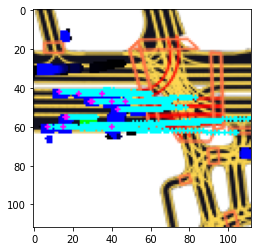

[[4.5222160e-01 4.5978218e-06 5.4777384e-01]]
[[4.3936461e-01 5.2656134e-04 5.6010884e-01]]
[[4.9775812e-01 3.6449882e-07 5.0224149e-01]]
[[4.6789345e-01 1.6780435e-06 5.3210491e-01]]
[[4.3757829e-01 3.3205419e-04 5.6208956e-01]]
[[4.44494814e-01 1.31913475e-05 5.55491984e-01]]
[[4.3381256e-01 3.4749868e-05 5.6615269e-01]]
[[4.3274295e-01 2.9445160e-04 5.6696254e-01]]
[[4.3534425e-01 3.2135711e-05 5.6462365e-01]]
[[4.3841040e-01 2.2670554e-05 5.6156689e-01]]


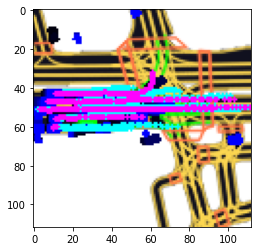

[[5.3369915e-01 1.6860930e-08 4.6630085e-01]]
[[5.3367037e-01 1.6850056e-08 4.6632963e-01]]
[[5.3139025e-01 1.7415669e-08 4.6860978e-01]]
[[5.3317094e-01 1.7220586e-08 4.6682906e-01]]
[[5.3201717e-01 1.7089675e-08 4.6798283e-01]]
[[5.3027445e-01 3.2145483e-08 4.6972546e-01]]
[[0.44830477 0.00081881 0.5508764 ]]
[[0.44844854 0.00100488 0.5505466 ]]


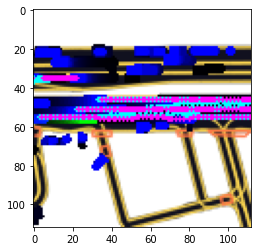

[[5.3541946e-01 1.6649601e-08 4.6458054e-01]]
[[5.3541946e-01 1.6649601e-08 4.6458054e-01]]
[[5.3369915e-01 1.6860930e-08 4.6630085e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3373140e-01 1.6873113e-08 4.6626860e-01]]
[[5.3517014e-01 1.8822828e-08 4.6482986e-01]]
[[5.3366190e-01 1.6846830e-08 4.6633807e-01]]


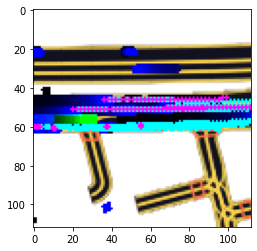

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


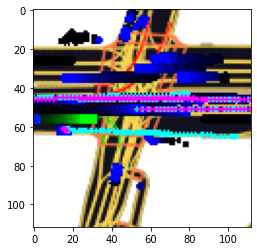

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]


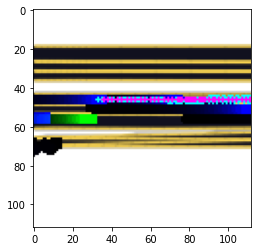

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3367037e-01 1.6850056e-08 4.6632963e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[4.3257976e-01 6.5107037e-05 5.6735510e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[0.4631925  0.04953774 0.48726982]]
[[0.45526236 0.00189986 0.5428378 ]]
[[0.4518667  0.00140847 0.5467248 ]]


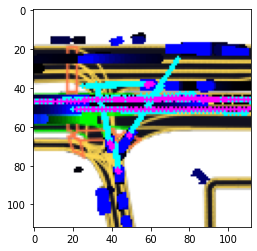

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[4.3970096e-01 4.7781796e-04 5.5982125e-01]]
[[4.3600467e-01 3.4835914e-04 5.6364691e-01]]
[[4.3958133e-01 4.8360578e-04 5.5993509e-01]]


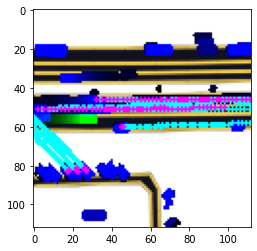

[[5.3369915e-01 1.6860930e-08 4.6630085e-01]]
[[5.3369915e-01 1.6860930e-08 4.6630085e-01]]
[[5.3367037e-01 1.6850056e-08 4.6632963e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


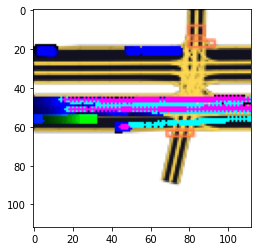

[[5.3428698e-01 1.7337889e-08 4.6571302e-01]]
[[5.3369915e-01 1.6860930e-08 4.6630085e-01]]
[[5.3541946e-01 1.6649601e-08 4.6458054e-01]]
[[5.3541946e-01 1.6649601e-08 4.6458054e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


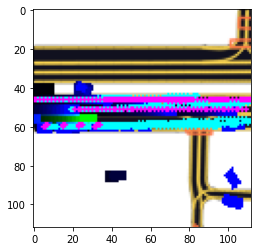

[[4.4260183e-01 4.6104318e-04 5.5693710e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[0.44240773 0.00131108 0.5562812 ]]
[[0.45871326 0.00233314 0.53895354]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[0.46467274 0.00315171 0.5321755 ]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


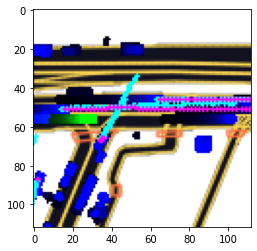

[[5.3541946e-01 1.6649601e-08 4.6458054e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


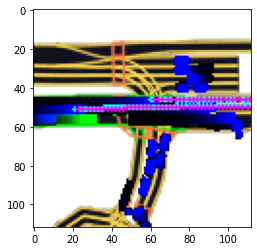

[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[0.46380585 0.02994403 0.50625014]]


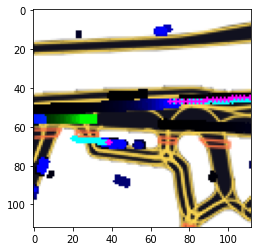

[[0.4634705  0.00379432 0.5327352 ]]
[[0.45235908 0.00138819 0.54625267]]


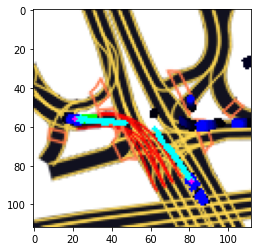

[[0.46010637 0.0037673  0.5361263 ]]
[[0.44622058 0.00061983 0.5531596 ]]
[[4.4352001e-01 7.7222676e-06 5.5647224e-01]]
[[4.3493062e-01 3.6159373e-04 5.6470776e-01]]


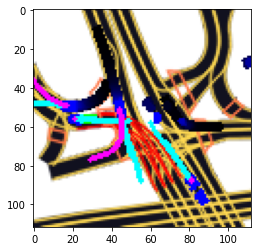

[[0.46655315 0.00541535 0.5280315 ]]
[[0.45302945 0.00213514 0.5448354 ]]
[[0.44643584 0.00063803 0.5529261 ]]


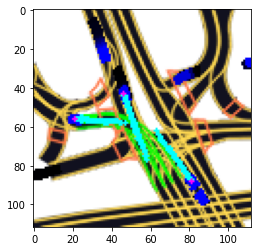

[[4.3070024e-01 3.5525745e-04 5.6894451e-01]]
[[0.449563   0.00110979 0.5493272 ]]
[[0.46649474 0.00662099 0.5268843 ]]


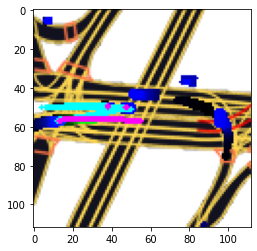

[[0.4476749  0.00091397 0.55141115]]
[[0.45145163 0.0008167  0.5477317 ]]
[[4.5496553e-01 3.9720067e-06 5.4503053e-01]]
[[4.3425447e-01 2.1911324e-04 5.6552649e-01]]
[[0.45128554 0.00103559 0.5476789 ]]
[[0.46798313 0.00848607 0.5235308 ]]


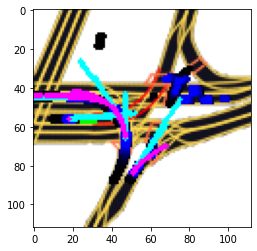

[[0.4594049  0.0014536  0.53914154]]
[[4.3752208e-01 1.5408706e-04 5.6232381e-01]]
[[4.5429376e-01 5.7475445e-06 5.4570055e-01]]


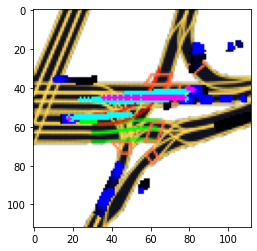

[[0.45124248 0.00112133 0.5476362 ]]
[[5.2835983e-01 3.8514340e-08 4.7164011e-01]]
[[4.8708043e-01 4.3510161e-07 5.1291913e-01]]
[[0.45068842 0.00243462 0.5468769 ]]
[[0.44893318 0.00108943 0.54997736]]
[[5.0068557e-01 2.0023015e-07 4.9931425e-01]]
[[4.9238169e-01 3.3014481e-07 5.0761801e-01]]
[[4.8570630e-01 5.2939225e-07 5.1429313e-01]]


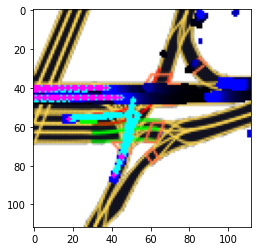

[[0.45541623 0.00183326 0.54275054]]
[[0.4604445  0.00424276 0.5353127 ]]
[[0.46178705 0.00262487 0.5355881 ]]
[[5.3266305e-01 1.7595882e-08 4.6733698e-01]]


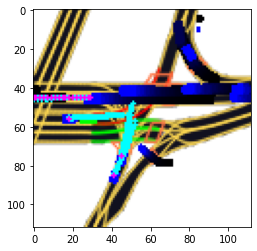

[[0.4507754  0.00143684 0.5477877 ]]
[[0.44689998 0.00077592 0.55232406]]
[[5.1063204e-01 9.4134577e-08 4.8936787e-01]]
[[5.1996166e-01 6.7367033e-08 4.8003832e-01]]
[[4.8297557e-01 5.4056295e-07 5.1702386e-01]]
[[4.8268044e-01 6.5202863e-07 5.1731890e-01]]
[[0.45039144 0.00193292 0.5476756 ]]


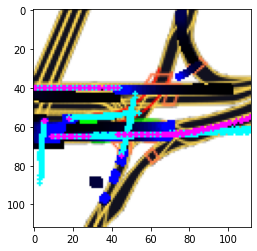

[[0.44882497 0.00102706 0.55014795]]
[[0.44957474 0.00078384 0.54964143]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


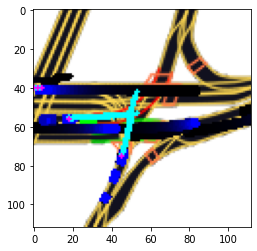

[[0.4589163  0.0025289  0.53855485]]
[[4.3439281e-01 3.0380863e-04 5.6530339e-01]]


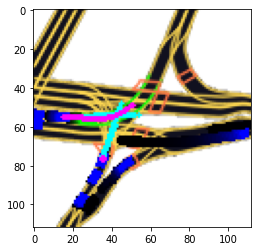

[[5.3491020e-01 1.7011926e-08 4.6508986e-01]]
[[5.3445721e-01 1.9144974e-08 4.6554282e-01]]
[[5.3319979e-01 1.7231704e-08 4.6680024e-01]]


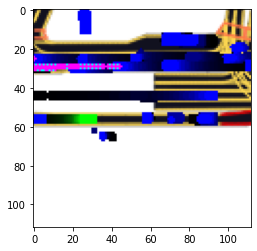

[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3471231e-01 2.8612089e-08 4.6528769e-01]]


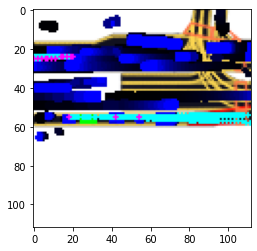

[[5.3369915e-01 1.6860930e-08 4.6630085e-01]]
[[4.3592128e-01 2.1672336e-04 5.6386203e-01]]
[[0.4486743 0.0010226 0.5503031]]
[[4.3707895e-01 4.2775928e-04 5.6249326e-01]]


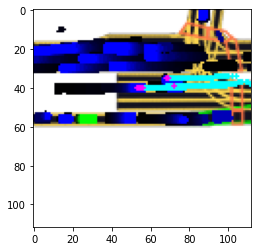

[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3367037e-01 1.6850056e-08 4.6632963e-01]]


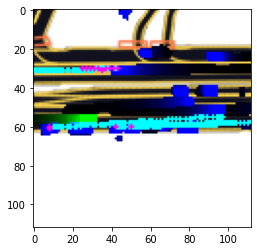

[[4.2536020e-01 1.2607932e-04 5.7451367e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[4.3904278e-01 3.0478000e-04 5.6065243e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[4.2803293e-01 1.4336899e-04 5.7182372e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[4.5052317e-01 6.9652683e-06 5.4946989e-01]]
[[0.46309826 0.00418285 0.5327189 ]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[0.44488004 0.00056124 0.55455875]]


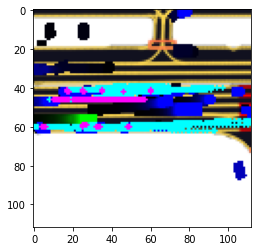

[[0.45410448 0.00229046 0.543605  ]]
[[0.4591279  0.00377667 0.5370954 ]]
[[0.46515077 0.00435044 0.5304988 ]]
[[4.4220269e-01 1.8727962e-05 5.5777854e-01]]
[[0.45362255 0.00118625 0.5451912 ]]
[[0.45186445 0.00130255 0.546833  ]]
[[0.4671232 0.0065419 0.5263349]]
[[5.3270888e-01 1.7613985e-08 4.6729115e-01]]


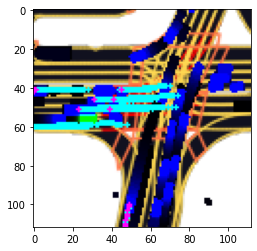

[[0.4541223  0.001225   0.54465264]]
[[4.492825e-01 5.121107e-04 5.502054e-01]]
[[0.4591657  0.00285681 0.53797746]]
[[0.45868677 0.00219925 0.539114  ]]
[[0.46425682 0.01747954 0.5182636 ]]
[[0.45729822 0.00227148 0.5404303 ]]
[[0.4588603  0.00303256 0.53810716]]
[[0.41045982 0.1777196  0.41182053]]
[[5.3380615e-01 1.6901343e-08 4.6619385e-01]]
[[5.2883923e-01 3.8929588e-08 4.7116068e-01]]


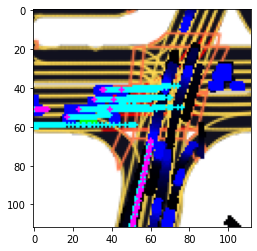

[[0.46434993 0.00583596 0.5298141 ]]
[[0.46783203 0.00461575 0.5275522 ]]
[[0.46928418 0.00839602 0.52231973]]
[[0.46097466 0.00171619 0.5373091 ]]
[[0.4632495 0.003435  0.5333154]]
[[0.4607579  0.00249415 0.53674793]]
[[0.4361356  0.11578532 0.44807905]]
[[5.3367037e-01 1.6850056e-08 4.6632963e-01]]
[[4.3998626e-01 4.7308888e-04 5.5954063e-01]]
[[0.44203225 0.09761287 0.46035483]]


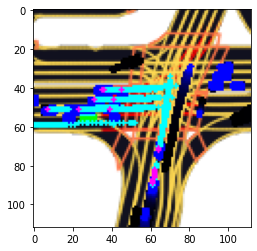

[[0.46627626 0.00739248 0.5263313 ]]
[[0.4527551  0.00112663 0.54611826]]
[[0.46907756 0.01071377 0.52020866]]
[[0.4671504  0.00833377 0.5245158 ]]
[[0.45966518 0.05470772 0.4856271 ]]
[[0.46079126 0.00202528 0.5371834 ]]
[[0.46809945 0.00704718 0.5248534 ]]
[[0.4372673  0.11600664 0.44672602]]
[[5.3369915e-01 1.6860930e-08 4.6630085e-01]]
[[0.4566036  0.00302469 0.54037166]]
[[0.4649739  0.00368159 0.53134453]]
[[0.40662554 0.1803781  0.41299632]]


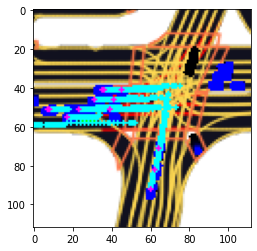

[[0.45783603 0.00183273 0.5403312 ]]
[[0.4487202  0.00077362 0.5505062 ]]
[[0.46670467 0.00510098 0.52819437]]
[[0.45831078 0.00310524 0.53858393]]
[[0.45378992 0.00143308 0.544777  ]]
[[5.2902597e-01 3.4386719e-08 4.7097397e-01]]
[[0.46985528 0.0079328  0.52221197]]
[[0.47040418 0.02829588 0.5012999 ]]
[[0.42917663 0.1287832  0.44204023]]
[[0.45607355 0.00195838 0.5419681 ]]
[[0.44147396 0.10087397 0.45765203]]
[[0.41154012 0.17223366 0.41622618]]
[[0.44817004 0.00093343 0.5508965 ]]
[[5.3367037e-01 1.6850056e-08 4.6632963e-01]]


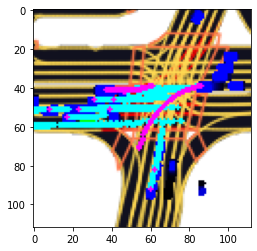

[[4.4567165e-01 4.3921475e-04 5.5388910e-01]]
[[0.45058605 0.0013184  0.5480956 ]]
[[0.44264308 0.00061757 0.5567394 ]]
[[0.44970858 0.00061506 0.54967636]]
[[0.45882493 0.00369286 0.5374822 ]]
[[0.46829677 0.02646292 0.5052403 ]]
[[4.3668360e-01 9.8365701e-05 5.6321806e-01]]
[[0.46866575 0.01688998 0.51444423]]
[[5.1073462e-01 1.1646667e-07 4.8926520e-01]]
[[4.5130414e-01 3.4387065e-06 5.4869241e-01]]
[[4.3517724e-01 5.4744218e-04 5.6427532e-01]]


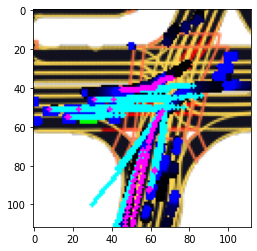

[[0.45512635 0.00121157 0.54366213]]
[[0.45604965 0.00224182 0.54170847]]
[[0.4500319  0.00080717 0.5491609 ]]
[[0.4523581  0.00071203 0.5469299 ]]
[[0.46534008 0.00408546 0.5305745 ]]
[[4.3970042e-01 4.0711992e-04 5.5989242e-01]]
[[4.4678950e-01 2.6538782e-04 5.5294514e-01]]
[[4.4201687e-01 4.3834557e-04 5.5754483e-01]]
[[0.4657536  0.01430707 0.51993936]]
[[0.4618556  0.04475537 0.49338907]]
[[0.41934803 0.15457113 0.42608085]]
[[4.383594e-01 3.443239e-04 5.612963e-01]]
[[0.45742714 0.0014327  0.5411402 ]]
[[4.3837777e-01 2.4877059e-05 5.6159735e-01]]


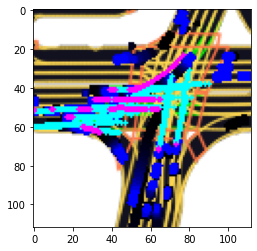

[[4.516948e-01 3.823154e-06 5.483014e-01]]
[[5.3381801e-01 1.6905844e-08 4.6618199e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[4.4302374e-01 3.2279998e-04 5.5665344e-01]]
[[4.4195792e-01 4.0903559e-04 5.5763304e-01]]
[[0.44347382 0.00068659 0.5558396 ]]
[[4.5910418e-01 1.9042783e-06 5.4089385e-01]]
[[5.3476536e-01 2.1520600e-08 4.6523464e-01]]
[[4.4434446e-01 1.1755268e-05 5.5564386e-01]]
[[4.3272883e-01 1.2461723e-04 5.6714660e-01]]


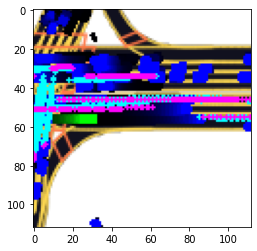

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[0.4513946  0.00155494 0.5470505 ]]
[[4.4953597e-01 4.0240625e-06 5.5045998e-01]]


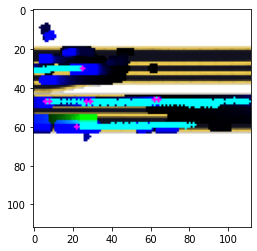

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]


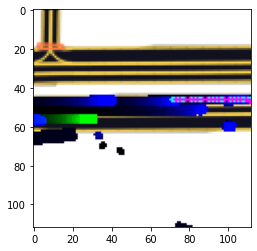

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3368562e-01 1.6855807e-08 4.6631444e-01]]


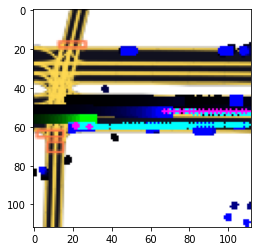

[[5.3367037e-01 1.6850056e-08 4.6632963e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


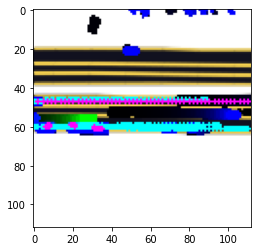

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[4.3333101e-01 3.8125305e-04 5.6628770e-01]]
[[0.45187864 0.0015035  0.5466179 ]]


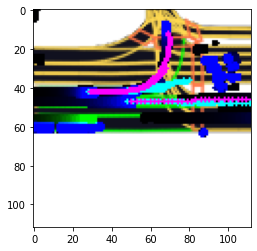

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


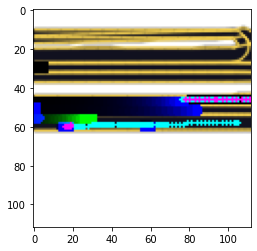

[[5.3382826e-01 1.6909684e-08 4.6617171e-01]]
[[0.44762918 0.0011224  0.55124843]]
[[0.45026276 0.00102522 0.548712  ]]
[[4.4094595e-01 5.4831180e-04 5.5850571e-01]]
[[0.4548778  0.06625067 0.47887158]]
[[0.4498984  0.08322041 0.46688116]]


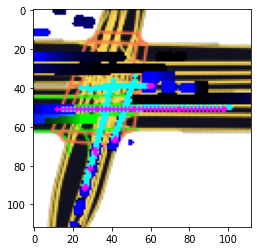

[[4.2960209e-01 2.5240052e-04 5.7014543e-01]]
[[0.4404045  0.00059596 0.55899954]]
[[4.4679004e-01 8.4320936e-06 5.5320156e-01]]
[[4.3317410e-01 2.6149144e-05 5.6679976e-01]]
[[4.3325657e-01 2.3775116e-05 5.6671965e-01]]


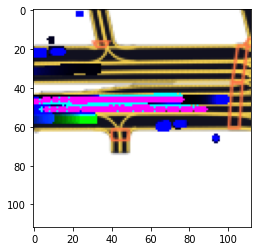

[[4.4061604e-01 4.3867406e-04 5.5894524e-01]]
[[4.5893988e-01 2.6325024e-06 5.4105753e-01]]
[[0.44559696 0.00083317 0.55356985]]
[[4.4050291e-01 1.8041977e-05 5.5947900e-01]]
[[0.470465   0.01832185 0.5112131 ]]
[[4.3536103e-01 1.6435086e-05 5.6462252e-01]]
[[4.3592852e-01 2.2204244e-05 5.6404924e-01]]
[[5.3350955e-01 1.8468892e-08 4.6649045e-01]]
[[4.3370739e-01 2.6191366e-04 5.6603062e-01]]
[[4.2876127e-01 8.8045257e-05 5.7115066e-01]]
[[4.3477181e-01 2.2714577e-05 5.6520551e-01]]


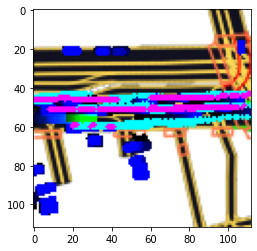

[[0.4446017  0.00138154 0.55401677]]
[[5.3076839e-01 2.6767943e-08 4.6923158e-01]]
[[4.9722880e-01 1.5567409e-07 5.0277102e-01]]
[[0.46529326 0.00676002 0.5279467 ]]
[[4.9734494e-01 3.1355739e-07 5.0265479e-01]]
[[4.9846223e-01 1.9789418e-07 5.0153762e-01]]
[[0.45013183 0.00113386 0.5487343 ]]
[[0.46329555 0.03759107 0.4991134 ]]
[[4.9171528e-01 3.1117384e-07 5.0828445e-01]]


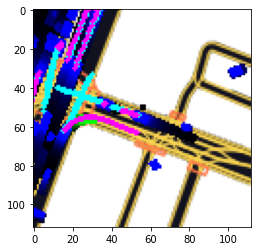

[[4.3508428e-01 2.6397014e-05 5.6488931e-01]]


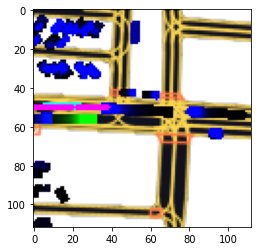

[[5.1271552e-01 1.0398004e-07 4.8728439e-01]]
[[4.3513891e-01 5.8580914e-05 5.6480247e-01]]
[[0.46456763 0.04976749 0.4856649 ]]
[[0.46272624 0.04550409 0.49176973]]


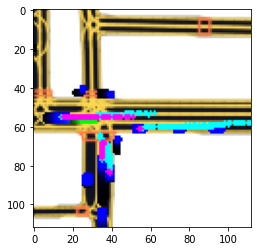

[[0.46571457 0.03316723 0.50111824]]


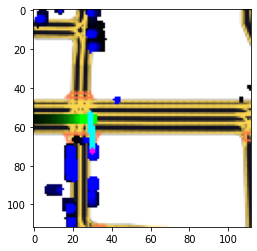

[[4.4013658e-01 1.8796683e-05 5.5984455e-01]]
[[4.4629127e-01 6.0702446e-06 5.5370265e-01]]
[[0.43065158 0.12286249 0.44648597]]


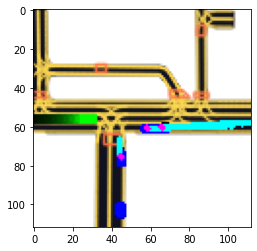

[[4.9254695e-01 4.0375733e-07 5.0745261e-01]]
[[0.46617052 0.03176073 0.50206876]]
[[0.45787838 0.00213357 0.539988  ]]


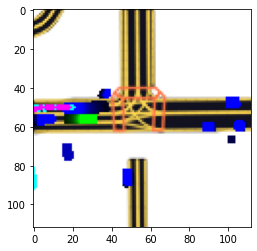

[[0.473031   0.02039721 0.50657177]]
[[0.43165243 0.12514712 0.44320044]]
[[0.4514278  0.00259417 0.54597807]]
[[4.4937000e-01 5.8801434e-06 5.5062407e-01]]


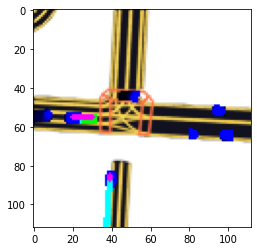

[[4.3072671e-01 6.0562103e-05 5.6921273e-01]]


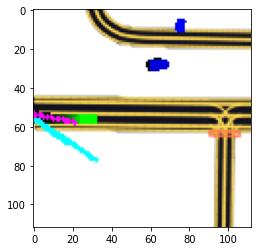

[[4.9120283e-01 2.8850559e-07 5.0879687e-01]]


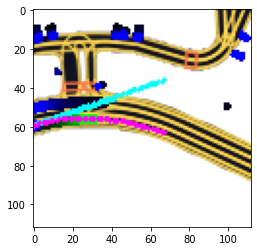

[[5.3377908e-01 1.6891075e-08 4.6622095e-01]]


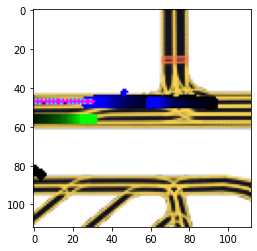

[[4.6947038e-01 1.1754109e-06 5.3052837e-01]]


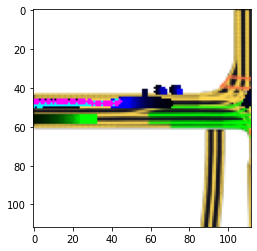

[[4.2515230e-01 1.2454871e-04 5.7472312e-01]]


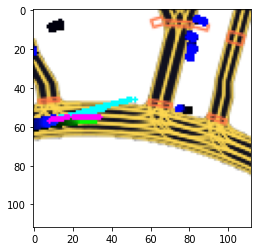

[[4.7079480e-01 1.2891402e-06 5.2920395e-01]]
[[4.3813524e-01 2.8591950e-05 5.6183618e-01]]


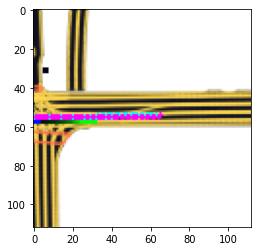

[[5.1370174e-01 1.2137883e-07 4.8629814e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]


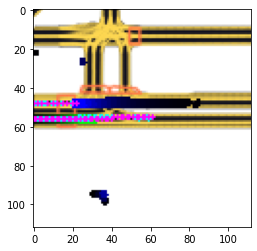

[[4.2971212e-01 1.7016186e-04 5.7011771e-01]]


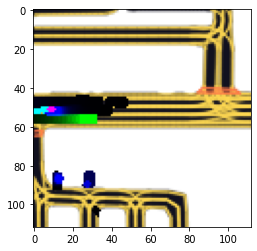

[[5.3541946e-01 1.6649601e-08 4.6458054e-01]]


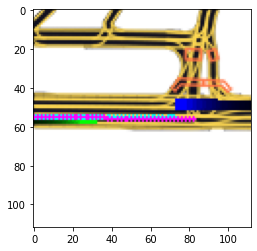

[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


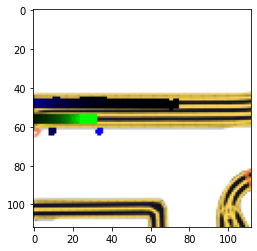

[[4.6530053e-01 1.5564908e-06 5.3469795e-01]]


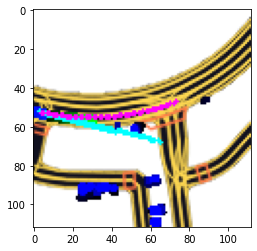

[[4.3487954e-01 1.9702344e-05 5.6510079e-01]]


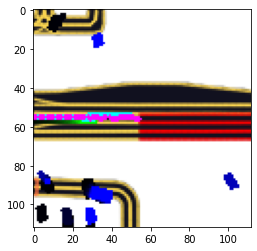

[[0.45351163 0.06913426 0.47735408]]
[[0.46772954 0.01392337 0.5183471 ]]
[[0.47004017 0.02826163 0.5016982 ]]
[[4.5108211e-01 5.1863776e-06 5.4891276e-01]]
[[4.281258e-01 2.447383e-04 5.716294e-01]]
[[0.44648156 0.00074048 0.55277795]]


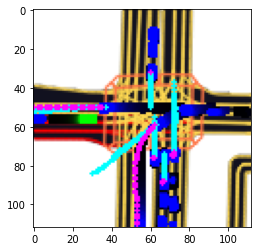

[[0.44939113 0.08621158 0.46439728]]
[[0.43980223 0.10845972 0.45173797]]
[[0.46498957 0.00784431 0.5271661 ]]
[[0.467927   0.02100223 0.5110708 ]]
[[0.4669461  0.02331619 0.5097377 ]]
[[0.46697214 0.0105647  0.52246314]]
[[0.3958115  0.204377   0.39981148]]
[[0.4564173  0.00187964 0.5417031 ]]
[[0.46330523 0.00304691 0.53364784]]
[[0.45859712 0.04401879 0.49738413]]


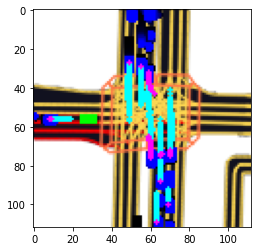

[[0.46985227 0.01339438 0.5167534 ]]
[[5.3337181e-01 2.5704862e-08 4.6662816e-01]]
[[0.44735536 0.00061179 0.55203277]]
[[0.40801254 0.17635082 0.41563672]]
[[0.45123821 0.00082774 0.54793406]]
[[0.45291176 0.00148413 0.54560417]]
[[0.46876207 0.00685913 0.52437884]]
[[5.2238977e-01 6.4437067e-08 4.7761011e-01]]
[[0.44766894 0.00137329 0.55095774]]
[[4.3451297e-01 4.4336807e-04 5.6504369e-01]]


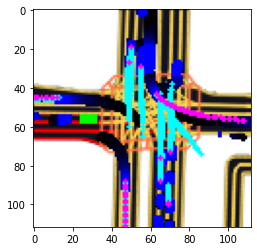

[[0.45883936 0.00331292 0.53784776]]
[[0.46729413 0.00637477 0.5263311 ]]
[[5.0532883e-01 1.7613863e-07 4.9467093e-01]]
[[0.44021097 0.10400105 0.45578802]]
[[5.0467944e-01 1.6608645e-07 4.9532038e-01]]
[[4.7008294e-01 1.2707471e-06 5.2991575e-01]]
[[4.9457479e-01 3.1011925e-07 5.0542492e-01]]
[[0.469294   0.01805634 0.5126497 ]]
[[0.45327    0.0749926  0.47173738]]


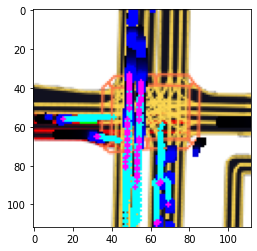

[[0.46538222 0.03897728 0.4956405 ]]
[[0.46707758 0.01217844 0.52074397]]
[[5.3313112e-01 3.6223359e-08 4.6686882e-01]]
[[5.2566075e-01 4.9318110e-08 4.7433922e-01]]
[[5.3325069e-01 1.7251372e-08 4.6674928e-01]]


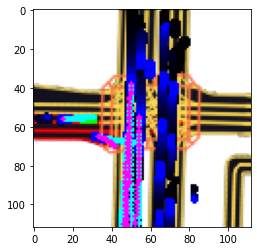

[[0.46115053 0.00286867 0.5359809 ]]
[[0.4493121  0.00122516 0.5494628 ]]
[[0.46482944 0.04968961 0.48548096]]
[[5.3443646e-01 2.5471985e-08 4.6556348e-01]]
[[5.3348303e-01 3.3799125e-08 4.6651691e-01]]


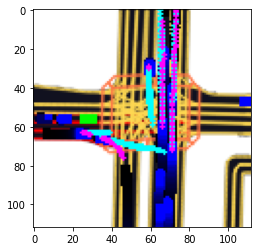

[[0.46646234 0.02512817 0.5084095 ]]
[[0.46263587 0.00541063 0.53195345]]
[[0.47136313 0.01401793 0.51461893]]


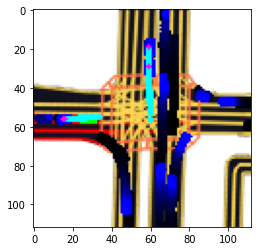

[[0.46782506 0.00846657 0.5237084 ]]
[[0.46747708 0.0215353  0.51098764]]
[[0.44731203 0.00074367 0.5519443 ]]
[[0.4563038  0.06531973 0.47837642]]


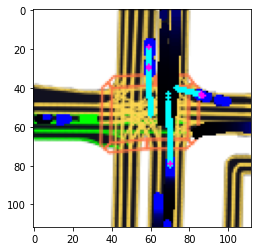

[[5.0471228e-01 1.2628351e-07 4.9528760e-01]]


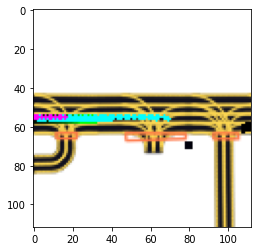

[[4.3074095e-01 2.5871122e-04 5.6900030e-01]]
[[0.4630572  0.00339355 0.5335493 ]]
[[0.43005487 0.13002042 0.4399247 ]]


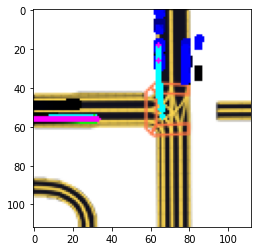

[[0.44988763 0.0788158  0.47129658]]
[[0.46540096 0.0281215  0.50647753]]
[[0.4689695  0.01009058 0.5209399 ]]
[[0.4672606  0.01009992 0.5226395 ]]
[[0.47050273 0.02356167 0.5059356 ]]
[[4.4631773e-01 9.0415861e-06 5.5367327e-01]]
[[0.4436125  0.09903518 0.45735243]]
[[0.44732982 0.00170113 0.55096906]]


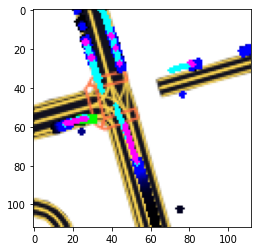

[[0.45963424 0.00449627 0.53586954]]


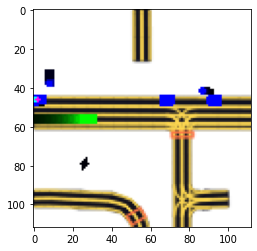

[[0.46355894 0.05087331 0.48556778]]
[[4.2841354e-01 5.1593703e-05 5.7153487e-01]]
[[0.4661163  0.03110167 0.50278205]]
[[4.7012788e-01 1.0987424e-06 5.2987105e-01]]
[[4.2756692e-01 9.1473608e-05 5.7234156e-01]]


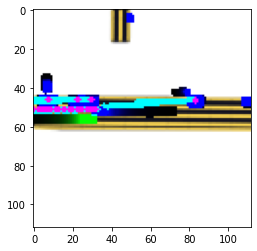

[[4.9278173e-01 3.8633087e-07 5.0721788e-01]]
[[0.46243882 0.04155914 0.49600205]]
[[4.3473473e-01 2.8383321e-05 5.6523693e-01]]
[[0.4277922  0.12824745 0.4439603 ]]
[[4.3216896e-01 3.5794823e-05 5.6779528e-01]]


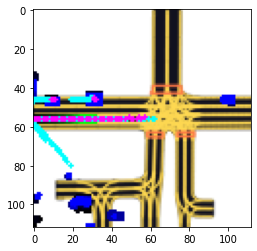

[[0.45172882 0.07809876 0.47017244]]
[[4.3275586e-01 9.1287075e-05 5.6715286e-01]]
[[0.45798963 0.0062555  0.5357548 ]]
[[4.6875983e-01 1.1397414e-06 5.3123903e-01]]
[[0.469844   0.03013599 0.50002   ]]


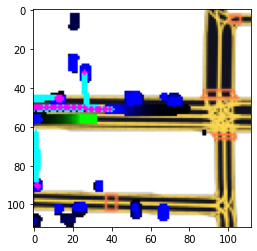

[[0.46589535 0.04833651 0.4857681 ]]
[[4.702633e-01 1.387817e-06 5.297353e-01]]
[[0.45254964 0.00206432 0.5453861 ]]
[[0.44800836 0.00065269 0.5513389 ]]
[[0.46858808 0.02564383 0.50576806]]
[[0.46111506 0.00566119 0.5332238 ]]
[[0.46764144 0.019199   0.5131595 ]]
[[0.4691472  0.02849184 0.502361  ]]
[[0.434898   0.11908866 0.4460134 ]]
[[0.4444036  0.09030075 0.4652957 ]]
[[0.44356498 0.00073682 0.55569816]]
[[0.468236   0.02587347 0.50589055]]


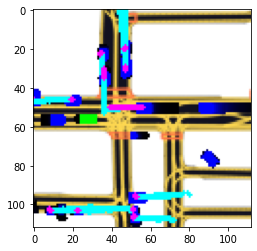

[[4.2988569e-01 2.0833549e-04 5.6990594e-01]]
[[0.4615123  0.00565067 0.53283703]]
[[0.4488836  0.00205652 0.54905987]]
[[4.3355289e-01 3.9338818e-05 5.6640774e-01]]
[[0.47114217 0.01268463 0.5161732 ]]
[[4.3626535e-01 2.3470062e-05 5.6371117e-01]]
[[0.4464415  0.00101278 0.5525457 ]]
[[4.3345523e-01 2.7815974e-04 5.6626660e-01]]


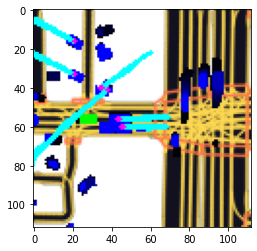

[[0.45339236 0.0016811  0.5449265 ]]
[[0.4625624  0.05332033 0.4841172 ]]
[[0.47053447 0.01674536 0.5127201 ]]
[[4.4464657e-01 6.3364851e-06 5.5534708e-01]]
[[0.44915745 0.00089513 0.5499474 ]]
[[0.46493167 0.0070648  0.5280036 ]]
[[4.3057612e-01 8.5821754e-05 5.6933808e-01]]
[[0.46451333 0.00532167 0.53016496]]
[[0.4610234  0.00238263 0.536594  ]]
[[4.3249714e-01 4.8211336e-04 5.6702077e-01]]


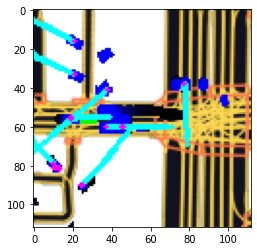

[[0.43729094 0.11015901 0.45255005]]
[[0.4539853  0.00136506 0.54464966]]
[[4.6024683e-01 2.6629798e-06 5.3975052e-01]]
[[0.47009802 0.01474197 0.51516   ]]
[[4.43184614e-01 1.45781105e-05 5.56800783e-01]]
[[0.46111035 0.00512855 0.53376114]]
[[0.46428198 0.004947   0.5307711 ]]
[[0.4653773  0.00349032 0.53113234]]
[[0.46278685 0.00365375 0.5335594 ]]
[[0.43873748 0.00056695 0.5606956 ]]
[[4.4588378e-01 1.0028510e-05 5.5410618e-01]]
[[4.7761911e-01 7.1128846e-07 5.2238023e-01]]


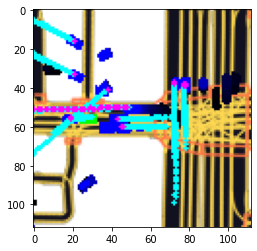

[[0.4606312  0.06187638 0.47749242]]
[[4.3764165e-01 4.2157641e-05 5.6231612e-01]]
[[4.3191868e-01 3.0526996e-04 5.6777608e-01]]
[[0.46629137 0.00475633 0.5289523 ]]
[[0.4624382  0.00351662 0.53404516]]
[[4.6661201e-01 1.5235277e-06 5.3338647e-01]]


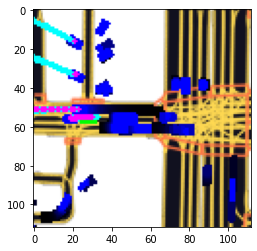

[[0.4445975  0.00078313 0.5546193 ]]
[[4.4367909e-01 2.3978492e-04 5.5608112e-01]]
[[0.4479125  0.00098907 0.5510984 ]]
[[4.41453815e-01 1.27581525e-05 5.58533370e-01]]
[[0.456782   0.00237004 0.5408479 ]]
[[0.4635475  0.00647277 0.52997977]]
[[0.4670644  0.00602594 0.52690965]]
[[0.4643741  0.00359588 0.53203   ]]
[[0.4641863  0.00462737 0.5311864 ]]
[[0.46555367 0.0141664  0.5202799 ]]
[[4.4537139e-01 4.3694707e-04 5.5419171e-01]]


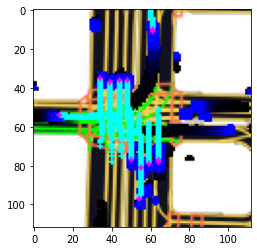

[[4.3883002e-01 3.4702927e-05 5.6113529e-01]]
[[0.4493171  0.00102573 0.54965717]]
[[4.3064466e-01 2.7724984e-05 5.6932753e-01]]
[[4.3666565e-01 4.2129590e-04 5.6291306e-01]]
[[4.3167832e-01 1.4058873e-04 5.6818104e-01]]
[[0.44061148 0.00075912 0.55862945]]
[[0.44282246 0.00088806 0.55628943]]
[[4.2791504e-01 1.5133870e-04 5.7193363e-01]]


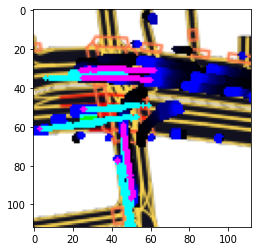

[[4.7474989e-01 7.3719730e-07 5.2524936e-01]]
[[4.9173656e-01 3.5980355e-07 5.0826311e-01]]
[[0.45112973 0.00110284 0.54776746]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3381801e-01 1.6905844e-08 4.6618199e-01]]
[[0.44668645 0.00088519 0.55242836]]
[[4.3221748e-01 6.8842877e-05 5.6771368e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[4.3314615e-01 2.6566200e-05 5.6682730e-01]]


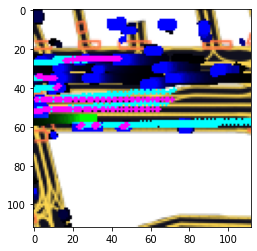

[[0.44357234 0.00063566 0.555792  ]]
[[4.3177044e-01 7.6331329e-05 5.6815320e-01]]
[[4.8509654e-01 5.8799367e-07 5.1490289e-01]]
[[4.4020671e-01 3.5421152e-04 5.5943906e-01]]
[[4.3015763e-01 4.6399862e-05 5.6979597e-01]]
[[4.8573443e-01 5.6481326e-07 5.1426500e-01]]
[[4.3936738e-01 2.0687696e-05 5.6061184e-01]]
[[4.5952252e-01 2.9243254e-06 5.4047459e-01]]


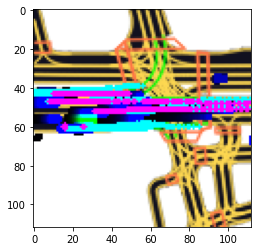

[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3367037e-01 1.6850056e-08 4.6632963e-01]]
[[5.3541946e-01 1.6649601e-08 4.6458054e-01]]
[[5.3377908e-01 1.6891075e-08 4.6622095e-01]]
[[4.3374878e-01 1.9227959e-05 5.6623203e-01]]
[[0.4595636  0.00227261 0.5381637 ]]
[[0.44689775 0.00123669 0.5518656 ]]
[[4.6392852e-01 2.6227524e-06 5.3606886e-01]]


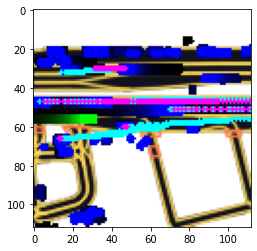

[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3608823e-01 2.3945285e-08 4.6391174e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3541946e-01 1.6649601e-08 4.6458054e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


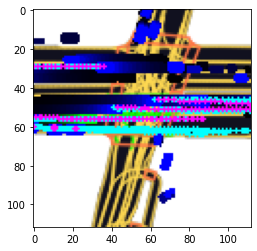

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3377908e-01 1.6891075e-08 4.6622095e-01]]


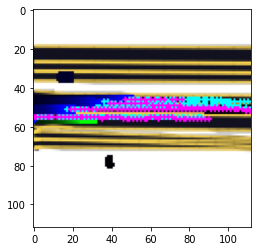

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3104186e-01 2.4125006e-08 4.6895817e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[0.46599242 0.00563417 0.52837336]]
[[4.3567735e-01 4.2634617e-04 5.6389636e-01]]


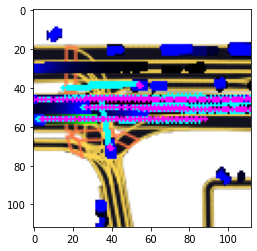

[[4.7554061e-01 1.0865452e-06 5.2445835e-01]]
[[4.8292950e-01 6.8889494e-07 5.1706988e-01]]
[[4.8338994e-01 7.0640613e-07 5.1660937e-01]]
[[5.3367037e-01 1.6850056e-08 4.6632963e-01]]
[[4.5526746e-01 3.4545510e-06 5.4472905e-01]]


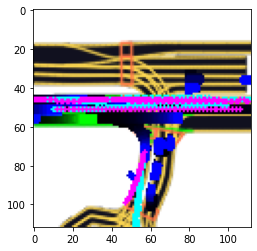

[[4.2800578e-01 6.9409711e-05 5.7192481e-01]]
[[4.300750e-01 8.236530e-05 5.698427e-01]]
[[4.6877989e-01 1.3869454e-06 5.3121877e-01]]
[[5.3541946e-01 1.6649601e-08 4.6458054e-01]]
[[0.46547598 0.00395158 0.5305725 ]]


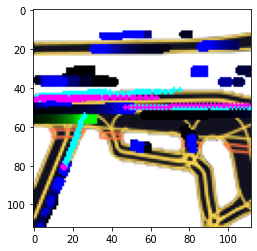

[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[4.3971202e-01 4.1781151e-04 5.5987018e-01]]
[[4.3987438e-01 4.8965891e-04 5.5963594e-01]]
[[4.3876502e-01 2.6872885e-04 5.6096619e-01]]
[[0.44208503 0.00073187 0.5571831 ]]
[[0.45286614 0.0010389  0.5460949 ]]
[[0.44604117 0.00068625 0.5532726 ]]
[[4.2708793e-01 8.0886362e-05 5.7283115e-01]]
[[0.44871297 0.00132539 0.5499616 ]]
[[4.4799727e-01 5.2753621e-06 5.5199742e-01]]
[[4.5722336e-01 4.0990685e-06 5.4277253e-01]]
[[4.3247095e-01 4.7201476e-05 5.6748182e-01]]
[[5.3419489e-01 2.4963972e-08 4.6580508e-01]]
[[5.2535284e-01 5.3090535e-08 4.7464705e-01]]
[[4.3039188e-01 3.9459395e-04 5.6921351e-01]]


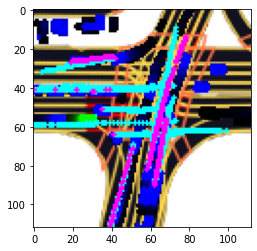

[[5.3541946e-01 1.6649601e-08 4.6458054e-01]]
[[0.45062023 0.00074033 0.5486394 ]]
[[4.3425801e-01 1.9455318e-05 5.6572258e-01]]
[[0.4566065  0.07253116 0.4708623 ]]
[[0.46588358 0.01414119 0.5199752 ]]
[[0.4554323  0.00165211 0.5429156 ]]
[[0.4522888  0.00118349 0.5465277 ]]
[[0.46362725 0.02614376 0.51022905]]
[[4.3069661e-01 2.3105087e-04 5.6907237e-01]]
[[4.3101066e-01 2.7912612e-05 5.6896132e-01]]
[[4.2682654e-01 1.2507661e-04 5.7304835e-01]]
[[4.2958644e-01 1.9579554e-04 5.7021773e-01]]
[[4.305367e-01 2.361677e-04 5.692272e-01]]
[[5.3493237e-01 1.7851372e-08 4.6506763e-01]]
[[4.2738163e-01 1.4947557e-04 5.7246894e-01]]
[[5.2587283e-01 6.2888958e-08 4.7412714e-01]]


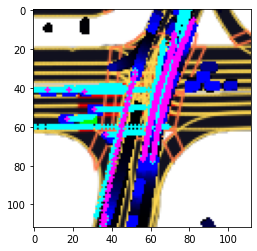

[[0.4522263  0.00205243 0.5457213 ]]
[[4.3682444e-01 3.1040446e-04 5.6286514e-01]]
[[0.44398212 0.00066044 0.5553574 ]]
[[0.45092502 0.00168621 0.54738873]]
[[5.3547937e-01 1.8339579e-08 4.6452066e-01]]


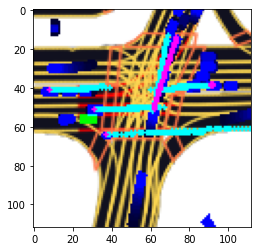

[[0.4674252 0.0112846 0.5212902]]
[[4.3048531e-01 2.0707978e-04 5.6930763e-01]]
[[4.4173673e-01 4.9821316e-04 5.5776507e-01]]
[[0.46359795 0.00420616 0.53219587]]
[[4.4361728e-01 5.1963882e-04 5.5586308e-01]]
[[5.3383499e-01 1.6912251e-08 4.6616504e-01]]
[[5.0718600e-01 2.1685504e-07 4.9281377e-01]]
[[0.45841083 0.00274618 0.538843  ]]
[[0.4590841  0.00327298 0.5376429 ]]


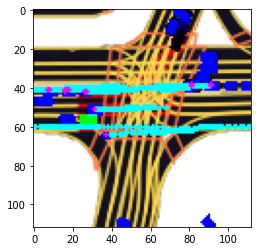

[[0.46499664 0.01555242 0.51945096]]
[[0.4633943  0.00509642 0.5315093 ]]
[[0.45025933 0.0008543  0.5488864 ]]
[[0.46329015 0.00306904 0.5336408 ]]
[[4.4110450e-01 2.4628185e-04 5.5864924e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3323394e-01 1.8086817e-08 4.6676603e-01]]
[[0.45533285 0.00343579 0.54123133]]
[[0.46440017 0.00804163 0.5275582 ]]
[[0.45752987 0.00240961 0.54006046]]
[[0.45838428 0.004748   0.5368677 ]]
[[0.46147427 0.01021306 0.5283127 ]]
[[0.45827678 0.00370806 0.5380152 ]]


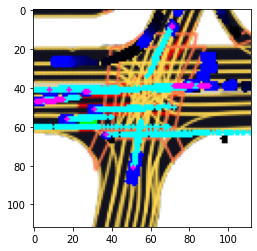

[[0.45033178 0.00112129 0.54854697]]
[[4.4528306e-01 3.9557781e-04 5.5432141e-01]]
[[0.4500336  0.00092627 0.5490401 ]]
[[4.310491e-01 9.475191e-05 5.688561e-01]]
[[4.8938945e-01 5.3750620e-07 5.1060998e-01]]
[[4.3818587e-01 2.2846022e-04 5.6158566e-01]]
[[5.3386551e-01 1.6923835e-08 4.6613449e-01]]
[[0.44654518 0.00064582 0.552809  ]]
[[4.8660421e-01 4.3836954e-07 5.1339537e-01]]
[[4.2947823e-01 1.7883224e-04 5.7034296e-01]]
[[4.5530787e-01 3.7479581e-06 5.4468834e-01]]
[[4.3396035e-01 1.2293429e-04 5.6591672e-01]]


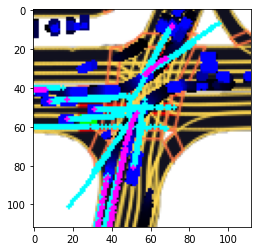

[[0.45644012 0.00305645 0.54050344]]
[[0.44898683 0.00055882 0.5504544 ]]
[[0.45711312 0.00084798 0.5420389 ]]
[[4.5040545e-01 7.0497144e-06 5.4958749e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[0.45458195 0.00223554 0.54318255]]
[[4.3495294e-01 3.0868257e-05 5.6501621e-01]]
[[4.3209115e-01 1.6111262e-04 5.6774771e-01]]
[[0.4653007  0.03242667 0.50227267]]
[[4.3730608e-01 2.9216096e-04 5.6240177e-01]]
[[0.44736078 0.00073708 0.5519022 ]]
[[4.3099165e-01 7.7479439e-05 5.6893086e-01]]


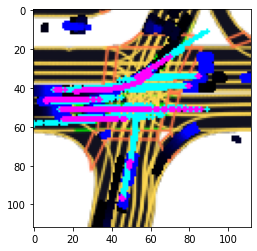

[[0.4610459  0.00491286 0.5340413 ]]
[[4.3672484e-01 1.2718889e-05 5.6326246e-01]]
[[0.45749533 0.00226481 0.5402399 ]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[0.45283177 0.07237653 0.47479168]]
[[5.3449911e-01 1.7420433e-08 4.6550089e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[4.9484462e-01 1.7747703e-07 5.0515521e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


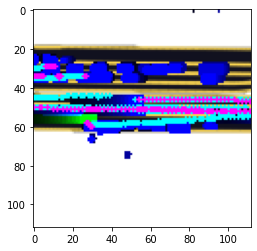

[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3342712e-01 2.4179672e-08 4.6657282e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]


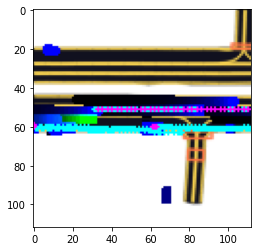

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


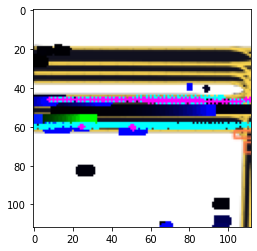

[[5.3541946e-01 1.6649601e-08 4.6458054e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.2616441e-01 3.9164444e-08 4.7383550e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


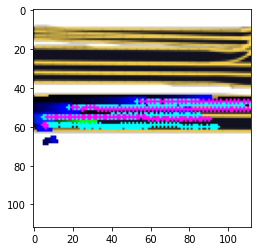

[[5.3377390e-01 1.6889139e-08 4.6622607e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


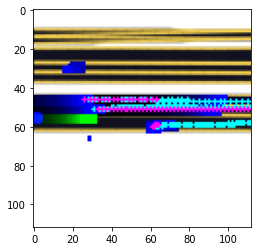

[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[0.46595794 0.00464222 0.5293998 ]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[0.4552625  0.00239641 0.5423411 ]]
[[5.3377050e-01 1.6887872e-08 4.6622950e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]


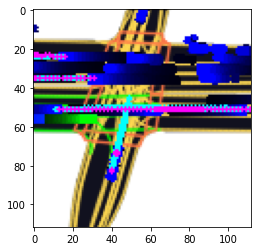

[[5.310982e-01 2.533471e-08 4.689018e-01]]
[[5.3191280e-01 4.2174516e-08 4.6808717e-01]]
[[5.3396153e-01 2.0522858e-08 4.6603847e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3369915e-01 1.6860930e-08 4.6630085e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


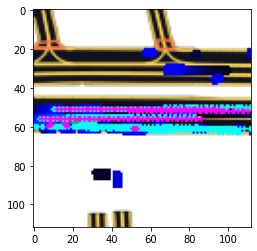

[[5.1715541e-01 9.9631308e-08 4.8284447e-01]]
[[5.3187251e-01 2.2674518e-08 4.6812752e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


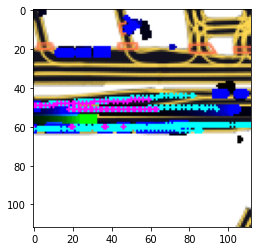

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3193784e-01 3.5390670e-08 4.6806207e-01]]
[[4.3273026e-01 7.7775585e-05 5.6719202e-01]]
[[0.44272178 0.00098184 0.5562963 ]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


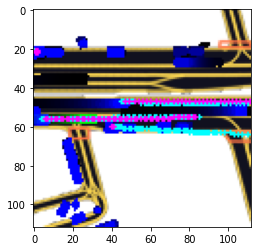

[[4.3777779e-01 2.1302565e-05 5.6220090e-01]]
[[5.3244591e-01 1.8365499e-08 4.6755406e-01]]
[[5.0692683e-01 1.5034568e-07 4.9307302e-01]]
[[5.3367037e-01 1.6850056e-08 4.6632963e-01]]
[[5.3367037e-01 1.6850056e-08 4.6632963e-01]]
[[5.3367037e-01 1.6850056e-08 4.6632963e-01]]
[[5.3367037e-01 1.6850056e-08 4.6632963e-01]]
[[5.3377908e-01 1.6891075e-08 4.6622095e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


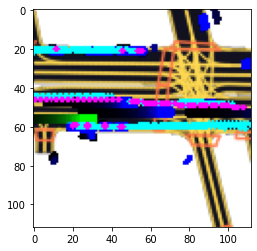

[[4.3651253e-01 2.3005382e-04 5.6325740e-01]]
[[4.3235993e-01 2.2275619e-04 5.6741732e-01]]
[[4.2963082e-01 1.8380198e-04 5.7018542e-01]]
[[0.44581774 0.00059074 0.5535915 ]]
[[4.4091764e-01 5.4296723e-04 5.5853933e-01]]
[[0.4709899  0.01245134 0.51655877]]


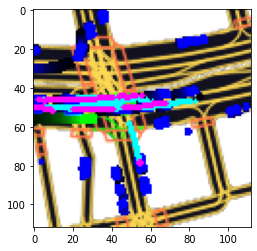

[[4.9603745e-01 3.0848366e-07 5.0396228e-01]]
[[4.8151445e-01 6.9987135e-07 5.1848483e-01]]
[[5.0852978e-01 1.0415140e-07 4.9147004e-01]]
[[4.9164525e-01 2.6397765e-07 5.0835454e-01]]
[[5.0224781e-01 1.4485191e-07 4.9775207e-01]]
[[5.213985e-01 5.921104e-08 4.786014e-01]]
[[5.13375044e-01 1.11548566e-07 4.86624777e-01]]


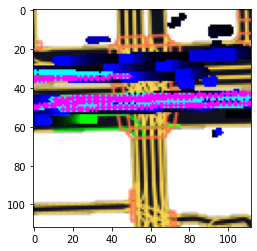

[[0.45473775 0.00232566 0.54293656]]
[[4.4056895e-01 2.2636934e-05 5.5940837e-01]]
[[4.5919898e-01 3.0104572e-06 5.4079801e-01]]
[[0.45894256 0.00247379 0.5385837 ]]


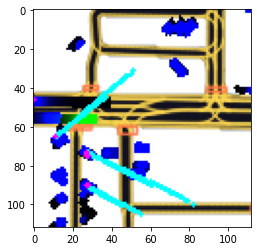

[[4.8351553e-01 6.4398932e-07 5.1648384e-01]]
[[4.3499282e-01 1.7524201e-04 5.6483185e-01]]
[[0.4496782  0.08213826 0.46818352]]


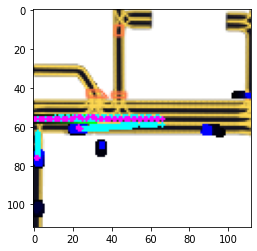

[[5.1006222e-01 1.4235387e-07 4.8993763e-01]]
[[5.3853226e-01 2.6828024e-08 4.6146771e-01]]


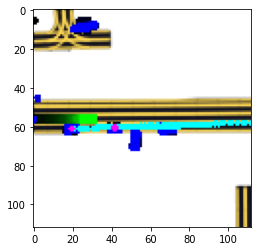

[[4.40981954e-01 1.28301335e-05 5.59005201e-01]]
[[4.4185174e-01 1.8886121e-05 5.5812931e-01]]
[[0.3833311  0.23017846 0.38649043]]
[[4.5345473e-01 4.8788615e-06 5.4654038e-01]]
[[0.4686846  0.01710721 0.5142082 ]]


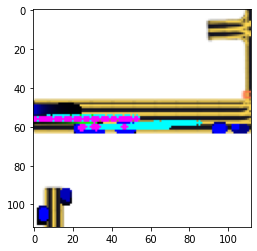

[[5.2237815e-01 9.6890808e-08 4.7762173e-01]]


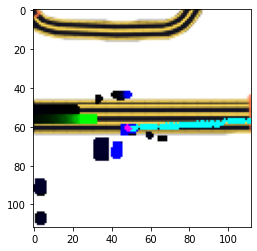

[[0.46456504 0.0454677  0.4899672 ]]
[[0.4531883  0.00138924 0.5454225 ]]
[[0.43788868 0.00102903 0.56108224]]
[[0.45798644 0.05461266 0.48740095]]
[[4.5259774e-01 3.4899049e-06 5.4739881e-01]]
[[0.43769798 0.1140609  0.44824108]]
[[4.363598e-01 2.883626e-05 5.636113e-01]]


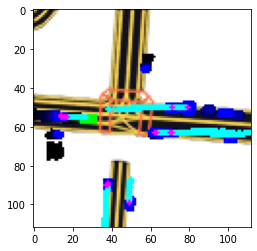

[[0.4633325  0.00265442 0.5340131 ]]
[[0.45806926 0.00076604 0.54116476]]
[[4.3857262e-01 2.5461565e-04 5.6117278e-01]]
[[4.3112618e-01 1.4426801e-04 5.6872958e-01]]


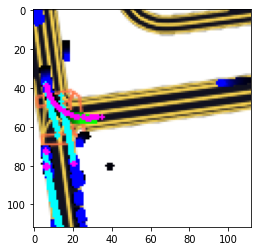

[[4.8642588e-01 4.3888122e-07 5.1357371e-01]]


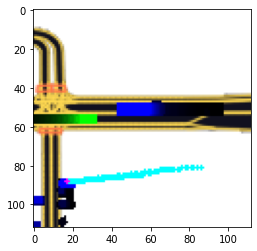

[[0.45866325 0.00268011 0.53865665]]


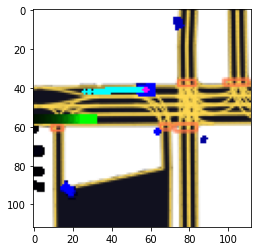

[[4.3921924e-01 1.9336379e-05 5.6076145e-01]]


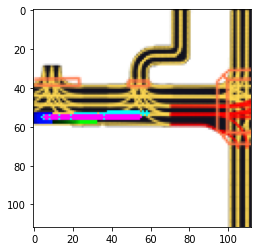

[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


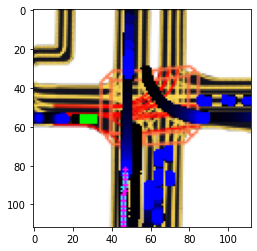

[[0.46009442 0.05516426 0.48474136]]
[[0.46824124 0.0128073  0.5189514 ]]
[[0.44320872 0.09602719 0.46076408]]
[[0.47090143 0.02110117 0.5079974 ]]
[[0.42420018 0.14732404 0.42847574]]
[[0.4456245  0.09180284 0.4625726 ]]
[[0.4654374  0.0249218  0.50964075]]
[[0.46992564 0.03132715 0.49874723]]
[[0.4592462  0.05673841 0.48401543]]
[[0.45299953 0.0650655  0.48193496]]


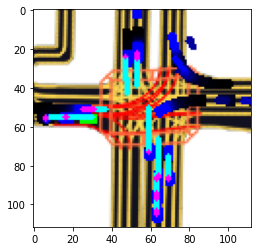

[[0.4623861  0.04694866 0.49066523]]
[[0.46526477 0.01077328 0.5239619 ]]
[[0.46535206 0.04884891 0.48579898]]
[[0.46429947 0.03970812 0.4959924 ]]
[[0.43961915 0.10823257 0.45214826]]
[[0.4566018  0.00243335 0.54096484]]
[[0.45729232 0.06425866 0.478449  ]]
[[0.4712911  0.01397713 0.51473176]]
[[0.46690333 0.01403095 0.51906574]]
[[4.8410726e-01 7.1914161e-07 5.1589203e-01]]
[[0.46900904 0.03869408 0.49229681]]


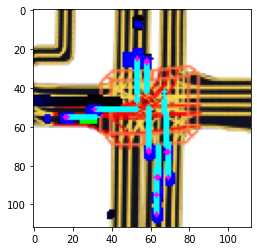

[[5.11961997e-01 1.11694376e-07 4.88037914e-01]]


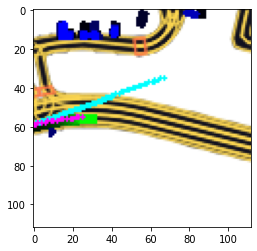

[[5.3334963e-01 2.4496108e-08 4.6665037e-01]]


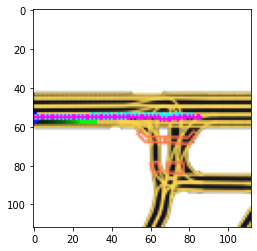

[[4.3293282e-01 2.4388110e-05 5.6704277e-01]]
[[0.47044745 0.02509934 0.50445324]]


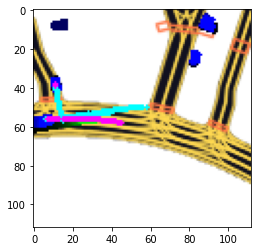

[[4.3303567e-01 2.3518581e-04 5.6672919e-01]]


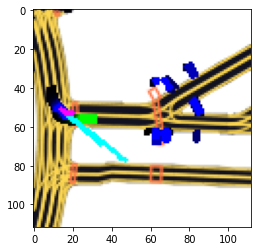

[[4.9140438e-01 3.6180822e-07 5.0859529e-01]]
[[4.9074465e-01 4.0072439e-07 5.0925487e-01]]


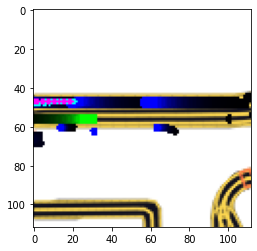

[[4.3997920e-01 1.0533164e-05 5.6001031e-01]]
[[5.0539535e-01 1.4315096e-07 4.9460453e-01]]
[[4.42307502e-01 1.47659575e-05 5.57677746e-01]]


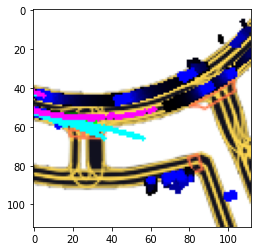

[[4.2953992e-01 6.3042069e-05 5.7039702e-01]]
[[4.2409497e-01 4.1405492e-05 5.7586366e-01]]
[[4.3513191e-01 2.7216774e-05 5.6484091e-01]]


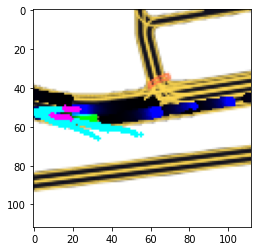

[[4.2968601e-01 2.1950787e-04 5.7009447e-01]]


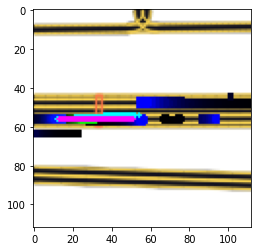

[[4.2734787e-01 1.4135035e-04 5.7251078e-01]]
[[4.27967817e-01 1.15288014e-04 5.71916878e-01]]


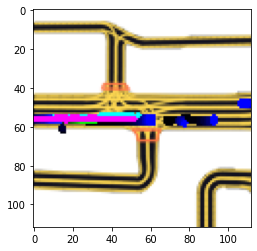

[[0.43867537 0.10720869 0.4541159 ]]
[[0.4434537  0.09417699 0.46236935]]
[[0.45794824 0.05513807 0.48691365]]
[[0.3949432  0.20372665 0.40133017]]
[[0.42383146 0.1471008  0.4290678 ]]
[[0.40233174 0.19014096 0.4075273 ]]
[[0.46244663 0.04214628 0.49540713]]
[[0.46447825 0.00662712 0.5288946 ]]


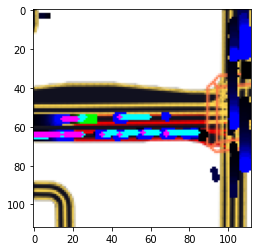

[[0.4121866  0.17431507 0.41349834]]
[[0.4162831  0.16488172 0.41883522]]
[[0.42075244 0.14744525 0.43180227]]
[[0.41292316 0.17085034 0.41622645]]
[[0.40345195 0.18983021 0.40671784]]
[[0.40856823 0.18276481 0.40866697]]
[[0.44984305 0.08241928 0.4677376 ]]
[[0.4402171  0.10659382 0.45318907]]
[[0.42546675 0.13727613 0.43725705]]


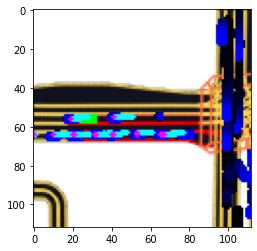

[[0.45776772 0.05901061 0.48322165]]
[[0.44440332 0.09852371 0.45707297]]
[[0.45063534 0.07137977 0.47798494]]
[[0.4244745  0.13885486 0.43667063]]
[[0.4605931  0.05859026 0.48081663]]
[[0.46171898 0.00411459 0.53416646]]
[[0.47149992 0.02681146 0.5016886 ]]
[[0.46879736 0.01053012 0.5206725 ]]
[[4.2936856e-01 4.7790344e-04 5.7015359e-01]]
[[5.3411388e-01 3.2571425e-08 4.6588606e-01]]


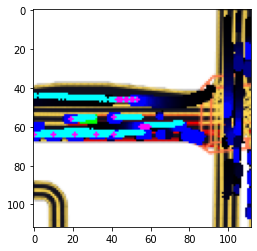

[[0.4148715  0.16255617 0.4225723 ]]
[[0.41672957 0.1607846  0.42248583]]
[[0.43259382 0.12690769 0.44049847]]
[[0.4345491  0.12307855 0.4423724 ]]
[[0.4259197  0.1425633  0.43151698]]
[[0.44643965 0.0940614  0.459499  ]]
[[0.42742413 0.13444634 0.43812954]]
[[0.43868062 0.11073992 0.45057946]]
[[0.4730995  0.01046152 0.516439  ]]
[[0.42373455 0.14376003 0.43250546]]
[[0.40941614 0.17462662 0.41595715]]
[[0.43780103 0.10982229 0.45237672]]


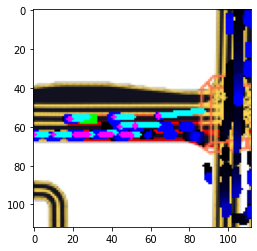

[[0.41182628 0.16865453 0.41951913]]
[[0.42210874 0.15533596 0.42255527]]
[[0.46654978 0.0041533  0.5292969 ]]
[[0.46809298 0.03971219 0.4921948 ]]
[[0.4647768  0.04844526 0.48677793]]
[[0.4505847  0.08826505 0.4611502 ]]
[[0.44050205 0.10246766 0.45703024]]
[[0.45949826 0.0574155  0.48308623]]
[[0.45322868 0.08292605 0.4638453 ]]
[[0.423296   0.14628738 0.43041655]]
[[0.42610115 0.13363448 0.4402644 ]]
[[0.4421459  0.09601463 0.4618395 ]]


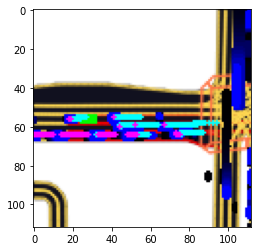

[[0.45228532 0.08289451 0.46482015]]
[[0.4663938  0.01340965 0.5201966 ]]
[[0.46945807 0.01446249 0.5160795 ]]
[[0.45673582 0.00108242 0.5421818 ]]
[[0.45751733 0.00254856 0.5399341 ]]
[[0.4596182  0.05670632 0.48367545]]
[[0.45753092 0.00181982 0.54064924]]
[[0.44674826 0.09124884 0.46200284]]
[[0.4631922  0.04855384 0.48825395]]
[[0.46982697 0.01157289 0.51860017]]
[[5.3325438e-01 1.8095067e-08 4.6674562e-01]]


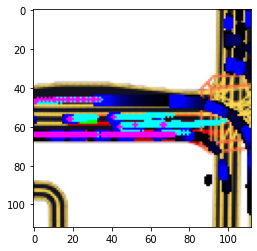

[[0.46725798 0.03531494 0.49742714]]
[[0.46198902 0.00471318 0.53329784]]
[[0.4478575  0.00072599 0.5514165 ]]
[[0.44762588 0.00127723 0.55109686]]
[[0.450326   0.00090129 0.54877275]]
[[0.45323443 0.00224443 0.5445211 ]]
[[0.45155495 0.00122806 0.54721695]]
[[0.4628532  0.00424406 0.5329028 ]]
[[0.45757133 0.00293703 0.5394916 ]]
[[5.3200018e-01 1.7083201e-08 4.6799982e-01]]
[[0.4628973  0.0467255  0.49037725]]
[[0.46873692 0.01129967 0.5199634 ]]
[[5.282507e-01 2.711749e-08 4.717493e-01]]


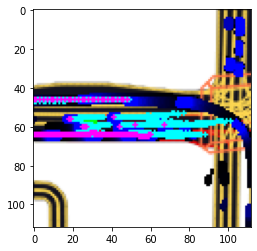

[[0.4616366  0.05286471 0.48549867]]
[[0.46218318 0.00536671 0.5324501 ]]
[[0.4542505  0.00132084 0.54442865]]
[[0.45635396 0.00199304 0.541653  ]]
[[0.4508979  0.00127153 0.5478305 ]]
[[0.46640137 0.04961158 0.48398712]]
[[0.46652168 0.0094748  0.52400357]]
[[0.46792167 0.02619107 0.50588727]]
[[0.46458203 0.01127062 0.52414733]]
[[5.3380448e-01 1.6900707e-08 4.6619555e-01]]
[[5.3254074e-01 3.5871341e-08 4.6745923e-01]]


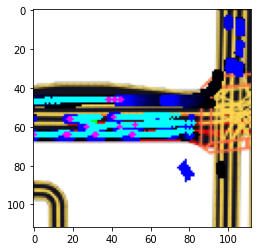

[[0.47254345 0.01206357 0.515393  ]]
[[0.4689471  0.03415382 0.49689904]]
[[4.3897006e-01 2.3701956e-04 5.6079292e-01]]
[[4.3914032e-01 3.3611534e-04 5.6052363e-01]]
[[4.3685520e-01 2.1389085e-04 5.6293094e-01]]
[[0.45503563 0.00137546 0.54358894]]


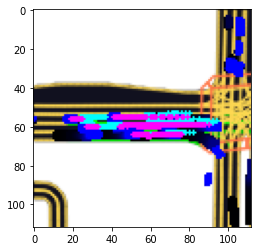

[[0.4416579  0.00060235 0.5577397 ]]
[[0.45093125 0.0009789  0.54808986]]
[[0.46824765 0.00963198 0.52212036]]
[[0.44114333 0.00059084 0.5582658 ]]
[[0.45621288 0.0015412  0.5422459 ]]
[[0.46659872 0.01052803 0.5228733 ]]
[[0.4542118  0.00131558 0.5444726 ]]
[[0.4660638  0.02575216 0.508184  ]]
[[0.46558428 0.04352495 0.49089074]]


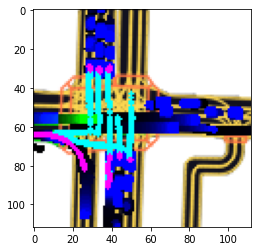

[[4.7346929e-01 1.1808471e-06 5.2652955e-01]]
[[0.44925982 0.00142365 0.54931647]]


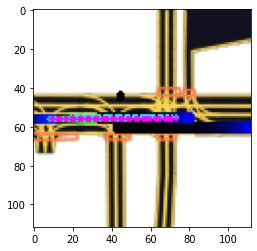

[[4.3251991e-01 6.6211236e-05 5.6741381e-01]]


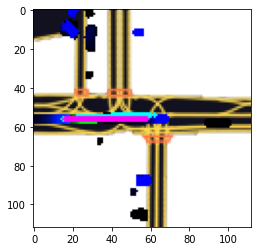

[[4.2980713e-01 7.4407675e-05 5.7011843e-01]]


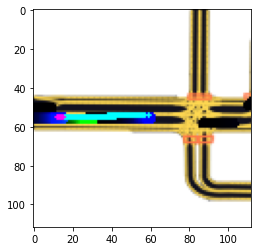

[[0.4385747  0.00073335 0.5606919 ]]
[[0.46311617 0.01184641 0.5250374 ]]


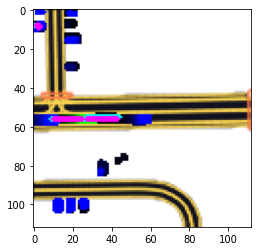

[[0.46286598 0.04029297 0.49684107]]
[[0.44520077 0.09135953 0.4634397 ]]
[[4.5845699e-01 2.5992695e-06 5.4154044e-01]]
[[0.43071795 0.12598577 0.4432963 ]]


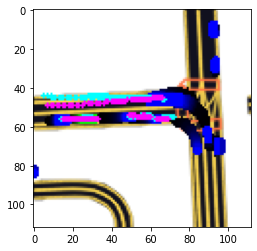

[[0.4062135  0.17821145 0.41557512]]
[[0.45415413 0.07466143 0.47118446]]
[[0.44610196 0.00104476 0.5528533 ]]
[[0.46497422 0.0442016  0.49082416]]
[[4.4018024e-01 9.9245581e-06 5.5980980e-01]]


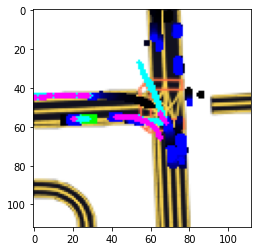

[[0.4366044  0.1194199  0.44397572]]
[[0.46411663 0.05152155 0.48436177]]
[[0.448497   0.00079385 0.5507092 ]]
[[0.43148744 0.12425121 0.4442613 ]]
[[0.43270668 0.12915759 0.43813574]]
[[0.47286853 0.01767791 0.5094536 ]]


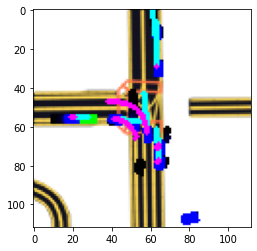

[[0.44336802 0.09697204 0.45965993]]
[[0.45615292 0.06229931 0.48154774]]
[[0.42886645 0.13765214 0.4334814 ]]
[[4.372722e-01 4.416081e-04 5.622862e-01]]
[[0.44662708 0.000851   0.55252194]]
[[0.45510507 0.06239237 0.48250255]]


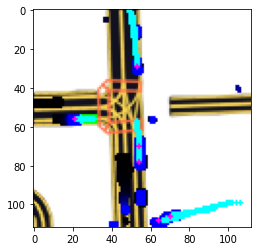

[[4.3617013e-01 4.1037725e-04 5.6341946e-01]]
[[0.47119296 0.02121817 0.50758886]]
[[0.4545606  0.06643821 0.4790012 ]]
[[0.46056604 0.04967356 0.48976034]]
[[0.46522936 0.01874161 0.516029  ]]
[[0.46621078 0.03926987 0.4945194 ]]
[[4.4093034e-01 3.2879623e-05 5.5903679e-01]]
[[0.47147843 0.01962264 0.508899  ]]


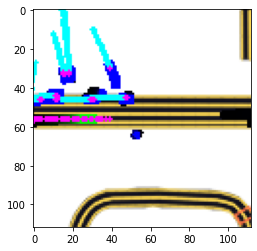

[[4.7530773e-01 7.4653957e-07 5.2469152e-01]]
[[0.4653544  0.03105403 0.5035915 ]]
[[4.4693318e-01 7.3324495e-06 5.5305952e-01]]
[[0.41949365 0.15016553 0.43034092]]
[[4.3456078e-01 1.4924558e-04 5.6528997e-01]]


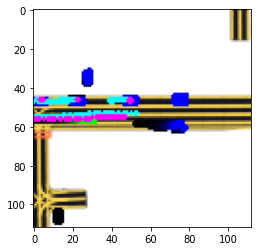

[[0.45367736 0.00155927 0.5447633 ]]
[[4.3911704e-01 8.5189340e-06 5.6087452e-01]]
[[4.3852675e-01 1.5987755e-05 5.6145722e-01]]


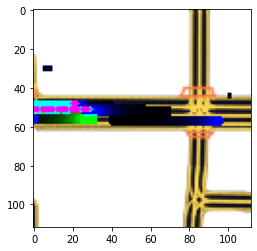

[[0.4673236  0.00599155 0.5266848 ]]
[[5.3095651e-01 2.1889432e-08 4.6904355e-01]]
[[4.6696708e-01 1.3556171e-06 5.3303152e-01]]
[[0.4469359  0.00095145 0.55211264]]


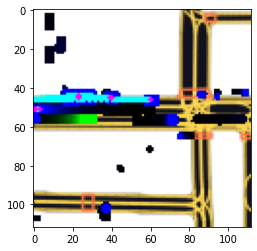

[[4.3582663e-01 2.1870980e-04 5.6395465e-01]]


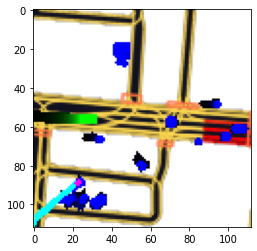

[[0.45956254 0.05031036 0.49012712]]
[[4.2633089e-01 1.4267660e-04 5.7352644e-01]]
[[0.46831214 0.02986239 0.50182545]]
[[0.43696013 0.00075417 0.5622858 ]]
[[4.4771764e-01 9.0491203e-06 5.5227333e-01]]
[[4.5936653e-01 3.0167314e-06 5.4063046e-01]]
[[0.44520822 0.00127111 0.5535207 ]]
[[4.2802209e-01 6.7185349e-05 5.7191074e-01]]
[[0.45159978 0.00177114 0.5466291 ]]
[[4.3615705e-01 1.9313355e-05 5.6382370e-01]]
[[4.3529058e-01 3.2095948e-05 5.6467730e-01]]
[[0.44354668 0.00109521 0.5553581 ]]


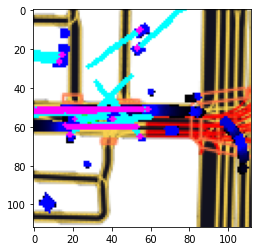

[[0.4620546  0.04915602 0.48878932]]
[[4.3384370e-01 1.8636645e-04 5.6596994e-01]]
[[0.4506858  0.00175156 0.5475626 ]]
[[0.44197807 0.00112427 0.55689764]]
[[0.46636257 0.0070493  0.52658814]]
[[4.2970598e-01 9.4066650e-05 5.7019991e-01]]
[[4.3010882e-01 2.8468593e-04 5.6960648e-01]]
[[4.395740e-01 5.043727e-04 5.599216e-01]]
[[4.2809522e-01 1.0764255e-04 5.7179713e-01]]


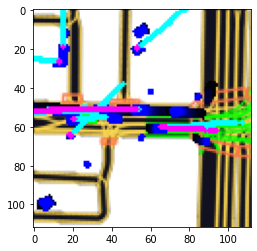

[[4.3233672e-01 2.9385634e-04 5.6736940e-01]]
[[4.3194139e-01 1.8224835e-04 5.6787634e-01]]
[[0.45565042 0.00217149 0.5421781 ]]
[[4.3139538e-01 1.9542653e-04 5.6840920e-01]]
[[0.44789764 0.0022867  0.54981565]]


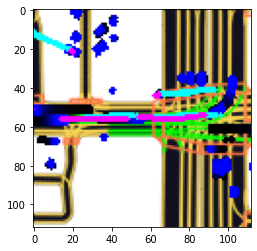

[[4.3237311e-01 2.2990118e-04 5.6739700e-01]]
[[4.5373458e-01 5.2443588e-06 5.4626018e-01]]
[[0.46911213 0.02562887 0.505259  ]]
[[0.45599124 0.07671267 0.46729603]]
[[0.45353004 0.00188956 0.5445804 ]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[0.4335143  0.12447523 0.4420105 ]]
[[0.44877687 0.0006731  0.55055004]]
[[4.2796057e-01 1.9845006e-04 5.7184100e-01]]


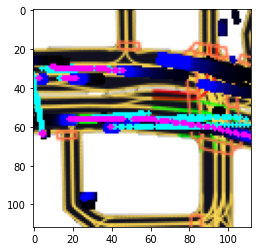

[[4.3636802e-01 3.5451830e-04 5.6327742e-01]]
[[4.43448961e-01 1.09991815e-05 5.56540072e-01]]
[[5.3377908e-01 1.6891075e-08 4.6622095e-01]]
[[5.3322870e-01 1.7242831e-08 4.6677125e-01]]
[[5.3541946e-01 1.6649601e-08 4.6458054e-01]]


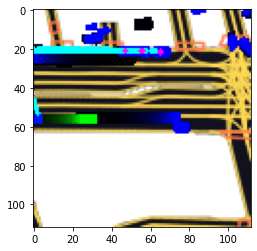

[[5.3367037e-01 1.6850056e-08 4.6632963e-01]]
[[5.3302681e-01 3.6802174e-08 4.6697310e-01]]


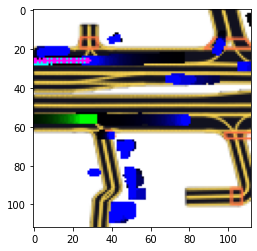

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[4.3386811e-01 1.5859735e-04 5.6597328e-01]]
[[0.46578687 0.01257073 0.5216424 ]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3369915e-01 1.6860930e-08 4.6630085e-01]]


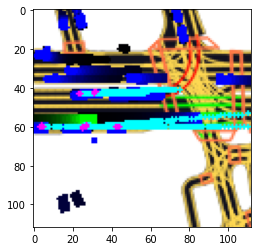

[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]


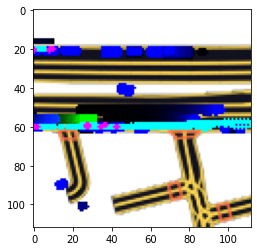

[[0.4676744  0.02618005 0.50614554]]
[[5.3546023e-01 1.6664817e-08 4.6453980e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[0.46704838 0.007214   0.5257376 ]]
[[5.3541946e-01 1.6649601e-08 4.6458054e-01]]
[[5.3541946e-01 1.6649601e-08 4.6458054e-01]]
[[5.3385365e-01 1.6919328e-08 4.6614635e-01]]
[[5.3546864e-01 1.6667974e-08 4.6453136e-01]]
[[5.2372730e-01 6.6394215e-08 4.7627264e-01]]


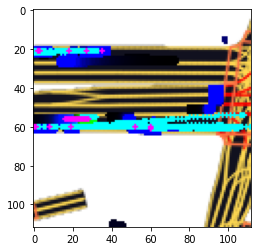

In [13]:
multi_vis = True
cvae.eval()
torch.set_grad_enabled(False)

# build a dict to retrieve future trajectories from GT
gt_rows = {}
for row in read_gt_csv(eval_gt_path):
    gt_rows[row["track_id"] + row["timestamp"]] = row["coord"]

eval_ego_dataset = EgoDataset(cfg, eval_zarr, rasterizer)
eval_dataset = AgentDataset(cfg, eval_zarr, rasterizer)

for frame_number in range(99, len(eval_zarr.frames), 100):  # start from last frame of scene_0 and increase by 100
    agent_indices = eval_dataset.get_frame_indices(frame_number) 
    if not len(agent_indices):
        continue

    # get AV point-of-view frame
    data_ego = eval_ego_dataset[frame_number]
    im_ego = rasterizer.to_rgb(data_ego["image"].transpose(1, 2, 0))
    center = np.asarray(cfg["raster_params"]["ego_center"]) * cfg["raster_params"]["raster_size"]
    
    predicted_positions = []
    predicted_positions1 = []
    predicted_positions2 = []
    predicted_positions3 = []
    target_positions = []

    if multi_vis == True:
        for v_index in agent_indices:
            data_agent = eval_dataset[v_index]
            out_net,confs,_,_ = cvae(data_agent)
            confs = confs.detach().cpu().numpy()
            print(confs)
            out_net1 = out_net[0][0]
            out_net2 = out_net[0][1]
            out_net3 = out_net[0][2]
            out_pos1 = out_net.reshape(-1, 2).detach().cpu().numpy()
            out_pos2 = out_net.reshape(-1, 2).detach().cpu().numpy()
            out_pos3 = out_net.reshape(-1, 2).detach().cpu().numpy()
            # store absolute world coordinates
            predicted_positions1.append(transform_points(out_pos1, data_agent["world_from_agent"]))
            predicted_positions2.append(transform_points(out_pos2, data_agent["world_from_agent"]))
            predicted_positions3.append(transform_points(out_pos3, data_agent["world_from_agent"]))
            # retrieve target positions from the GT and store as absolute coordinates
            track_id, timestamp = data_agent["track_id"], data_agent["timestamp"]
            target_positions.append(gt_rows[str(track_id) + str(timestamp)] + data_agent["centroid"][:2])


        # convert coordinates to AV point-of-view so we can draw them
        predicted_positions1 = transform_points(np.concatenate(predicted_positions1), data_ego["raster_from_world"])
        predicted_positions2 = transform_points(np.concatenate(predicted_positions2), data_ego["raster_from_world"])
        predicted_positions3 = transform_points(np.concatenate(predicted_positions3), data_ego["raster_from_world"])
        target_positions = transform_points(np.concatenate(target_positions), data_ego["raster_from_world"])

        draw_trajectory(im_ego, predicted_positions1, (34,222,79))
        draw_trajectory(im_ego, predicted_positions2, (220,235,21))
        draw_trajectory(im_ego, predicted_positions3, PREDICTED_POINTS_COLOR)
        draw_trajectory(im_ego, target_positions, TARGET_POINTS_COLOR)

        plt.imshow(im_ego)
        plt.show()

    else:
        for v_index in agent_indices:
            data_agent = eval_dataset[v_index]
            out_net,confs,_,_ = cvae(data_agent)
            confs = confs.detach().cpu().numpy()
    #         print(confs)
            out_net = out_net[0][np.argmax(confs)]
            out_pos = out_net.reshape(-1, 2).detach().cpu().numpy()
            # store absolute world coordinates
            predicted_positions.append(transform_points(out_pos, data_agent["world_from_agent"]))
            # retrieve target positions from the GT and store as absolute coordinates
            track_id, timestamp = data_agent["track_id"], data_agent["timestamp"]
            target_positions.append(gt_rows[str(track_id) + str(timestamp)] + data_agent["centroid"][:2])


        # convert coordinates to AV point-of-view so we can draw them
        predicted_positions = transform_points(np.concatenate(predicted_positions), data_ego["raster_from_world"])
        target_positions = transform_points(np.concatenate(target_positions), data_ego["raster_from_world"])

        draw_trajectory(im_ego, target_positions, TARGET_POINTS_COLOR)
        draw_trajectory(im_ego, predicted_positions, PREDICTED_POINTS_COLOR)


        plt.imshow(im_ego)
        plt.show()